In [1]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

import torch
import torch.nn as nn
from torchvision import models, transforms

from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

import pytorch_lightning as pl
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
from pytorch_lightning import Trainer
from RESNET101 import resnet101, ResNet101_Weights
import torch
import numpy as np
import cv2

from sklearn.preprocessing import LabelEncoder
from scipy.stats import mannwhitneyu
from scipy.optimize import linear_sum_assignment
import matplotlib.patches as mpatches
from sklearn.preprocessing import RobustScaler
import igraph as ig
import networkx as nx
import cairo
import community.community_louvain as cl
from sklearn.neighbors import kneighbors_graph
import sknetwork as skn
from sknetwork.clustering import Louvain
from sklearn.metrics import adjusted_rand_score
import seaborn as sns


from torch.utils.data import DataLoader, TensorDataset, Subset
from sklearn.model_selection import StratifiedKFold
import torch.optim as optim
import pytorch_lightning as pl

In [2]:
data_folder = '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise'
folders = ['group1', 'group2', 'group3', 'group4']
file_list = []
annotations = []

for folder in folders:
    folder_path = os.path.join(data_folder, folder)
    
    if os.path.exists(folder_path):
        #List all files in the folder
        files = os.listdir(folder_path)
        
        #Add filenames to the file_list and annotations to the annotations list
        file_list.extend([os.path.join(folder_path, file) for file in files])
        annotations.extend([folder] * len(files))

print("File List:", file_list)
print("Annotations:", annotations)    

print(len(file_list))
print(len(annotations))

File List: ['/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell11', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell5', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell7', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell6', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell13', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell8', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell12', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell10', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell16', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell18', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/group1/cell3', '/h

In [3]:
true_labels = np.array(annotations)

In [4]:
true_labels

array(['group1', 'group1', 'group1', 'group1', 'group1', 'group1',
       'group1', 'group1', 'group1', 'group1', 'group1', 'group1',
       'group1', 'group1', 'group1', 'group1', 'group1', 'group1',
       'group1', 'group1', 'group2', 'group2', 'group2', 'group2',
       'group2', 'group2', 'group2', 'group2', 'group2', 'group2',
       'group2', 'group2', 'group2', 'group2', 'group2', 'group2',
       'group2', 'group2', 'group2', 'group2', 'group3', 'group3',
       'group3', 'group3', 'group3', 'group3', 'group3', 'group3',
       'group3', 'group3', 'group3', 'group3', 'group3', 'group3',
       'group3', 'group3', 'group3', 'group3', 'group3', 'group3',
       'group4', 'group4', 'group4', 'group4', 'group4', 'group4',
       'group4', 'group4', 'group4', 'group4', 'group4', 'group4',
       'group4', 'group4', 'group4', 'group4', 'group4', 'group4',
       'group4', 'group4'], dtype='<U6')

In [5]:
group_to_num = {'group1': 0, 'group2': 1, 'group3': 2, 'group4': 3}
numeric_labels = np.array([group_to_num[g] for g in true_labels])
unique_labels = set(numeric_labels)

In [6]:
transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

In [7]:
#Load the pre-trained ResNet101 model
resnet101 = models.resnet101(pretrained=True)

# Remove the final fully connected layer (fc) to get the 2048-dimensional feature vector
resnet101.fc = torch.nn.Identity()

/home/deev/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/deev/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [8]:
def extract_features(file, model):
    #Load the image as a 224x224 array
    input_image = Image.open(file).convert("RGB")

    #NEW: padding--target size (224x224) and create a black background
    target_size = (224, 224)
    background = Image.new("RGB", target_size, (0, 0, 0))  # Black background

    #Get the size of the input image
    input_width, input_height = input_image.size

    #Calculate the position to paste the image at the center
    x_offset = (target_size[0] - input_width) // 2
    y_offset = (target_size[1] - input_height) // 2

    #Paste the input image onto the black background
    background.paste(input_image, (x_offset, y_offset))

    #Prepare image for model
    input_tensor = transform(background)
    input_batch = input_tensor.unsqueeze(0) # Create a mini-batch as expected by the model

    #Get the feature vector and extract features
    with torch.no_grad():
        features = model(input_batch)

    return features

In [9]:
features_stack = []
images_order = [] # To track (cell_id, [list of hybridizations])
gene_hybridization_names = ["gene1", "gene2", "gene3"]

for img in file_list:
    features_list = []
    hybridizations_list = [] 
    # Extract the cell identifier from the file path
    cell_id = img.split('/')[-1]  # e.g., "3243", "1560"


    for file in os.listdir(img):
        #Skip segmentation files
        if "cell_seg" in file:
            continue
        # Track if a valid gene hybridization was found
        matched = False

        for hybridization in gene_hybridization_names:  # Loop through full hybridization names
            if hybridization in file: #Check if the exact hybridization is in the filename
                feat = extract_features(os.path.join(img, file), resnet101) 
                features_list.append(np.array(feat.squeeze()))
                hybridizations_list.append(hybridization)
                matched = True
                break  # Stop searching once we find a match
        #If no valid gene hybridization was found in this file, print a warning
        if not matched:
            print(os.path.join(img, file))
            print(f"Warning: Unmatched file (not a gene hybridization) → {file}")
    

    if features_list:  #Ensure features exist before concatenation
        features_stack.append(np.concatenate(features_list, axis=0))
        images_order.append((cell_id, hybridizations_list))  # Track cell ID & hybridizations
        

# onvert list to numpy array
features_stack = np.stack(features_stack)

print(features_stack.shape)  #Expected shape: (num_cells, 2048 * num_hybridizations)

(80, 6144)


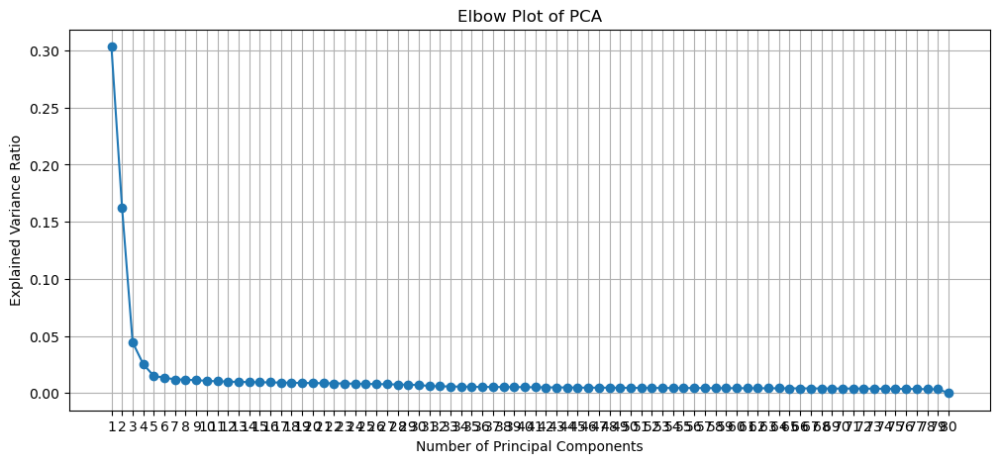

In [65]:
# Create an elbow plot
pca2 = PCA()
pca2.fit(features_stack)
# Explained variance ratio
explained_variance_ratio = pca2.explained_variance_ratio_
plt.figure(figsize=(12, 5))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.xlabel("Number of Principal Components")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot of PCA")
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.grid(True)
plt.show()

In [66]:
np.cumsum(pca2.explained_variance_ratio_)

array([0.30333304, 0.46595162, 0.51030755, 0.5356378 , 0.5504462 ,
       0.5638825 , 0.5757715 , 0.5874396 , 0.5986461 , 0.6092964 ,
       0.61955523, 0.62950265, 0.6392078 , 0.6487991 , 0.6581661 ,
       0.6675001 , 0.67657644, 0.6855192 , 0.6943448 , 0.7030393 ,
       0.7116185 , 0.7200385 , 0.7283739 , 0.7364742 , 0.74435616,
       0.7521981 , 0.75981814, 0.76726717, 0.7744765 , 0.7815413 ,
       0.7876008 , 0.7934727 , 0.7991694 , 0.8047088 , 0.8101119 ,
       0.815444  , 0.8207107 , 0.8259422 , 0.8311229 , 0.83625394,
       0.8412136 , 0.84614915, 0.85100615, 0.85585356, 0.86053723,
       0.86521566, 0.86987466, 0.87453   , 0.879076  , 0.8835978 ,
       0.88808215, 0.89251226, 0.8969328 , 0.9013107 , 0.90567154,
       0.91002345, 0.91433114, 0.91859645, 0.92281675, 0.9270233 ,
       0.9312192 , 0.9353759 , 0.93952423, 0.94362324, 0.94769883,
       0.9517533 , 0.9557732 , 0.9597415 , 0.963633  , 0.96752053,
       0.9713953 , 0.9752051 , 0.9789806 , 0.9826637 , 0.98629

In [10]:
#Perform PCA
pca = PCA(n_components=5, random_state=22)
pca.fit(features_stack)
pcs = pca.transform(features_stack)

In [11]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

In [94]:
filenames = np.array(file_list)

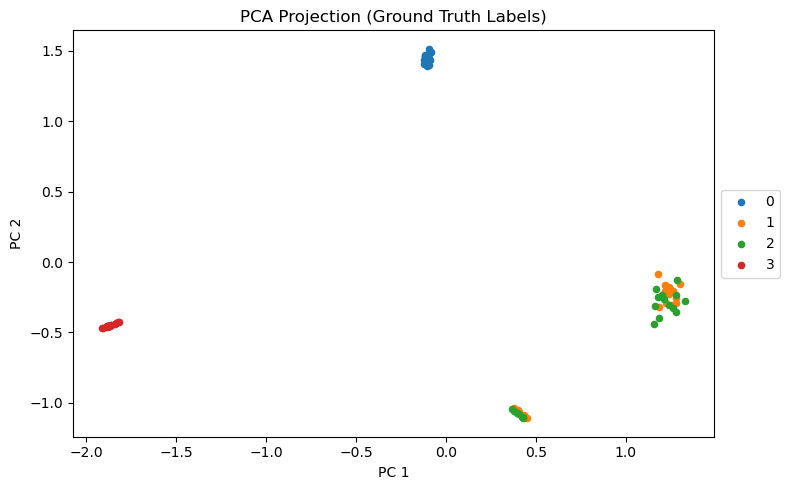

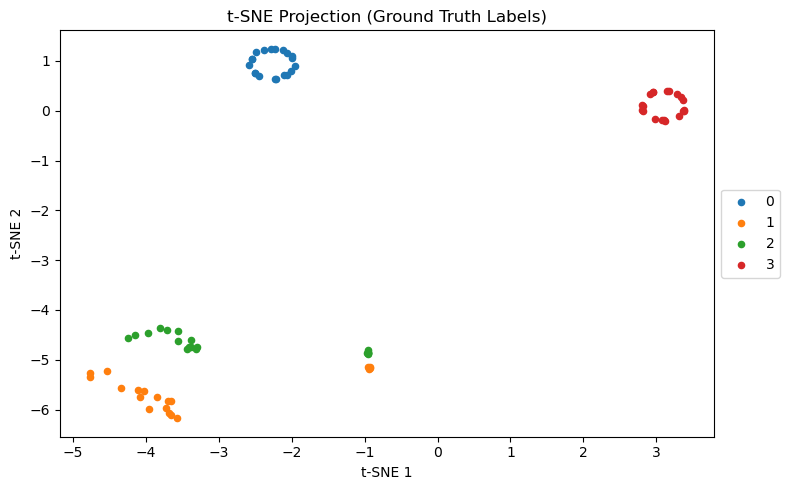

In [13]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

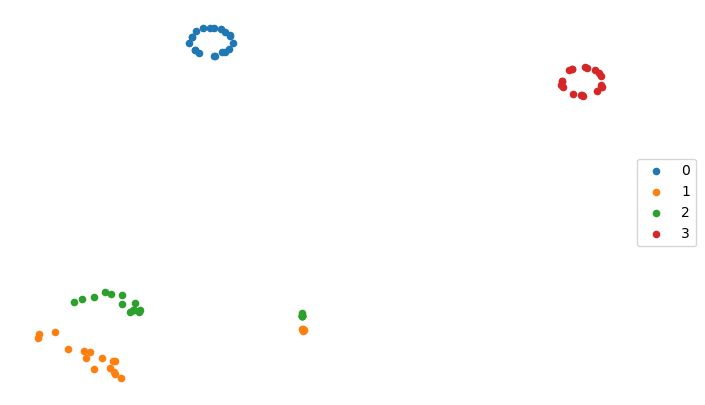

In [17]:
# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
# Remove the x and y axis, ticks, and labels
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.gca().get_xaxis().set_ticks([])
plt.gca().get_yaxis().set_ticks([])

# Remove the axis labels and title
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig("tsne_simulated_nuc_peri_noise_normal.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [14]:
print("\nCluster Counts:")
cluster_counts = {}
for label in unique_labels:
    count = np.sum(numeric_labels == label)
    cluster_counts[label] = count
    print(f"Cluster {label}: {count}")


Cluster Counts:
Cluster 0: 20
Cluster 1: 20
Cluster 2: 20
Cluster 3: 20


### With min max scaling

In [18]:
features_stack = []
images_order = [] # To track (cell_id, [list of hybridizations])
count_matrix = pd.read_csv("/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri_withnoise/min-max_count_matrix.csv", index_col=0)
count_matrix.index = count_matrix.index.astype(str)
gene_hybridization_names = list(count_matrix.columns) 


for img in file_list:
    features_list = []
    hybridizations_list = [] 
    # Extract the cell identifier from the file path
    cell_id = img.split('/')[-1]  # e.g., "3243", "1560"

    #Get counts for this cell (full hybridization names remain)
    counts = count_matrix.loc[cell_id]

    for file in os.listdir(img):
        #Skip segmentation files
        if "cell_seg" in file:
            continue
        # Track if a valid gene hybridization was found
        matched = False

        for hybridization in gene_hybridization_names:  # Loop through full hybridization names
            if hybridization in file: #Check if the exact hybridization is in the filename
                feat = extract_features(os.path.join(img, file), resnet101) * counts[hybridization]
                features_list.append(np.array(feat.squeeze()))
                hybridizations_list.append(hybridization)
                matched = True
                break  # Stop searching once we find a match
        #If no valid gene hybridization was found in this file, print a warning
        if not matched:
            print(os.path.join(img, file))
            print(f"Warning: Unmatched file (not a gene hybridization) → {file}")
    

    if features_list:  #Ensure features exist before concatenation
        features_stack.append(np.concatenate(features_list, axis=0))
        images_order.append((cell_id, hybridizations_list))  # Track cell ID & hybridizations
        

# convert list to numpy array
# onvert list to numpy array
features_stack = np.stack(features_stack)
print(features_stack.shape)

(80, 6144)


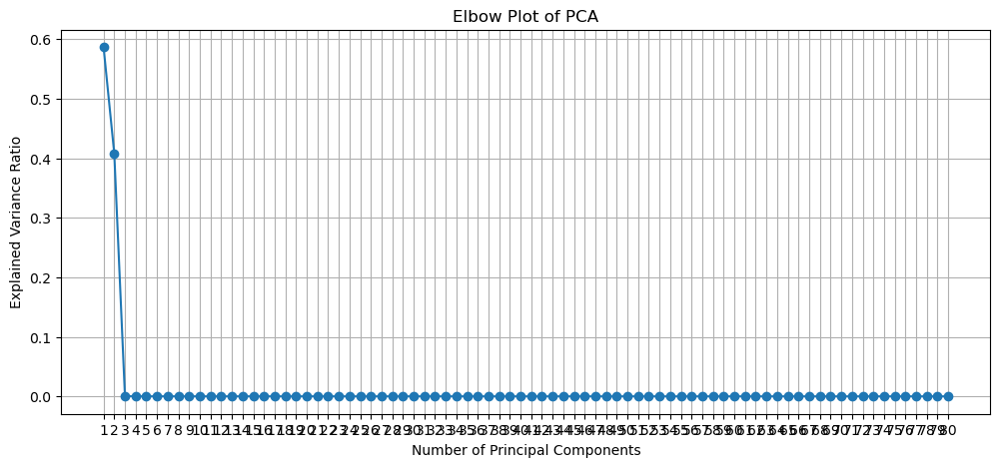

In [85]:
# Create an elbow plot
pca3 = PCA()
pca3.fit(features_stack)
# Explained variance ratio
explained_variance_ratio2 = pca3.explained_variance_ratio_
plt.figure(figsize=(12, 5))
plt.plot(range(1, len(explained_variance_ratio2) + 1), explained_variance_ratio2, marker='o', linestyle='-')
plt.xlabel("Number of Principal Components")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot of PCA")
plt.xticks(range(1, len(explained_variance_ratio2) + 1))
plt.grid(True)
plt.show()

In [19]:
#Perform PCA
pca = PCA(n_components=3, random_state=22)
pca.fit(features_stack)
pcs = pca.transform(features_stack)

In [20]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

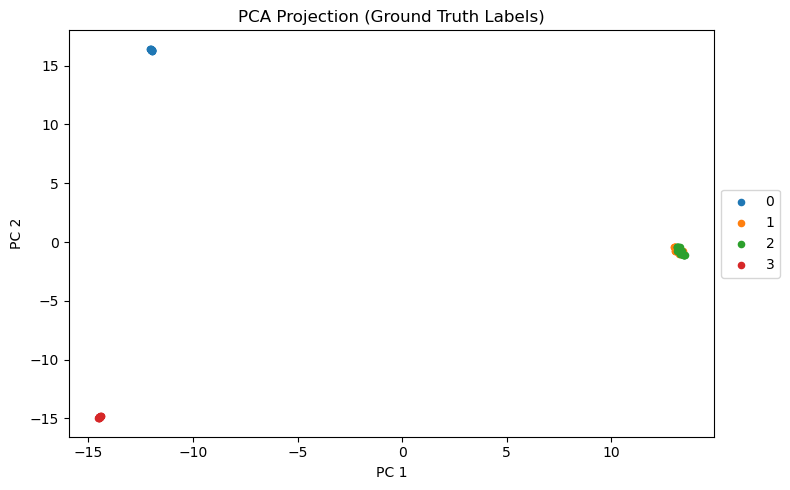

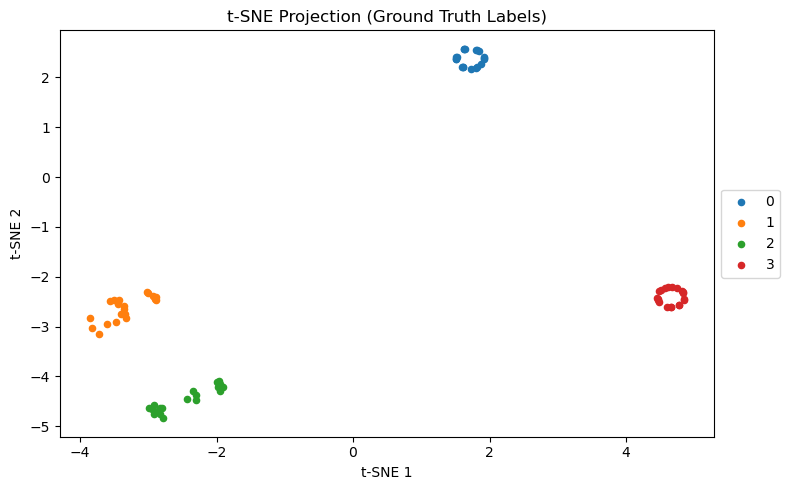

In [21]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

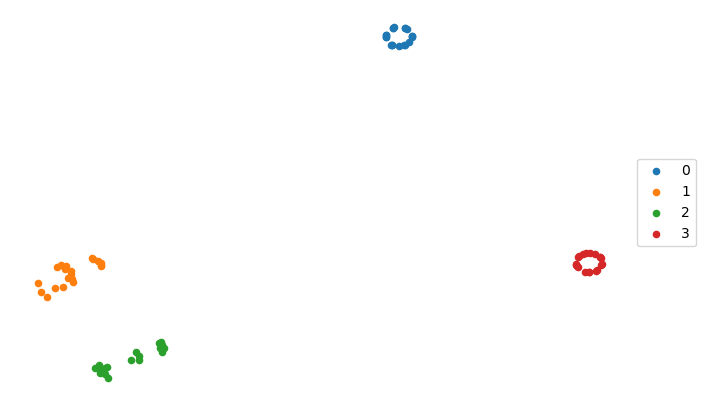

In [23]:
# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
# Remove the x and y axis, ticks, and labels
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.gca().get_xaxis().set_ticks([])
plt.gca().get_yaxis().set_ticks([])

# Remove the axis labels and title
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig("tsne_simulated_nuc_peri_noise_weighted.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [24]:
numeric_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

In [25]:
# Transform individual 3-channel (RGB) images during reading
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Read and process individual images
def read_images(file):
    input_image = Image.open(file).convert("RGB")  # Load the image and convert to RGB
    input_image = transform(input_image)  # Apply transformation
    return input_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


images_all_tensor shape: torch.Size([80, 3, 224, 672])


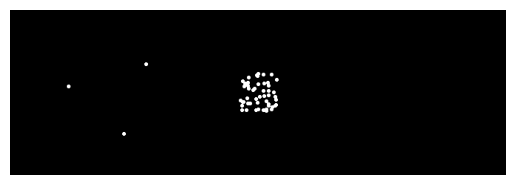

In [29]:
images_all = {}

for file_path in file_list:  # `file_list` contains the paths to all image folders
    features = []
    for img in os.listdir(file_path):
        if "cell_seg" in img:
            continue
        else:
            features.append(read_images(file_path + '/' + img))

    # Combine all gene features side by side into a single tensor
    feat = torch.cat(features, dim=2)  # Concatenate along the width dimension
    images_all[file_path] = feat

# Convert the dictionary of tensors to a single tensor
images_all_tensor = torch.stack(list(images_all.values()))  # Shape: (num_images, num_genes, 3, 224, 224)

# Print shape for verification
print("images_all_tensor shape:", images_all_tensor.shape)

# Plot one of the transformed 3-channel images (RGB)
# Remove the x and y axis, ticks, and labels
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().get_xaxis().set_ticks([])
plt.gca().get_yaxis().set_ticks([])
plt.imshow(images_all_tensor[25].permute(1, 2, 0))  # Showing only the first 3-channel image (first gene)
plt.show()

In [30]:
# make cluster labels into tensor format
cluster_labels = torch.from_numpy(numeric_labels).long()

In [ ]:
# Define the modified MLP classifier
from RESNET101 import resnet101, ResNet101_Weights
class MLPResNetClassifier(pl.LightningModule):
    def __init__(self, num_classes=4, dropout_rate=0.1):
        super().__init__()
        # Feature extractor (ResNet50)
        self.feature_extractor = resnet101(weights=ResNet101_Weights.DEFAULT)
        self.feature_extractor.fc = nn.Identity()  # Remove the final classification layer

        # Fully connected layers (MLP)
        hidden_sizes = [2048, 1024, 512, 256] 
        self.feature_layers = nn.Sequential(
            nn.Linear(hidden_sizes[0], hidden_sizes[1]),
            nn.BatchNorm1d(hidden_sizes[1]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[1], hidden_sizes[2]),
            nn.BatchNorm1d(hidden_sizes[2]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[2], hidden_sizes[3]),
            nn.BatchNorm1d(hidden_sizes[3]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
        )

        # Output layer
        self.output = nn.Linear(hidden_sizes[3], num_classes)

        # Loss function
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, patches):
        # Extract features using ResNet50
        x = self.feature_extractor(patches)
        x = self.feature_layers(x)  # Pass through MLP
        x = self.output(x)  # Output classification scores
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=0.001)

# Prepare data
images_all_tensor = images_all_tensor.to('cuda')
cluster_labels = cluster_labels.to('cuda')
dataset = TensorDataset(images_all_tensor, cluster_labels)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

# Initialize model
model = MLPResNetClassifier(num_classes=4)
model = model.to('cuda')

# Initialize PyTorch Lightning Trainer
trainer = Trainer(max_epochs=50)

# Train the model
trainer.fit(model, dataloader)

# Evaluation function
def evaluate_model(model, dataloader):
    model.eval()  # Set model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, labels in dataloader:
            images, labels = images.to('cpu'), labels.to('cpu')  # Move data to GPU
            outputs = model(images)  # Get model predictions
            _, predicted = torch.max(outputs, 1)  # Get predicted class
            total += labels.size(0)
            correct += (predicted == labels).sum().item()  # Count correct predictions

    accuracy = 100 * correct / total
    return accuracy


# Create a test DataLoader
test_dataset = TensorDataset(images_all_tensor, cluster_labels)  # Replace with test tensors
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Evaluate the model
accuracy = evaluate_model(model, test_dataloader)
print(f"Model Accuracy: {accuracy:.2f}%")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX A5000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
2025-06-09 22:39:43.150043: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-09 22:39:43.165436: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already bee

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


Model Accuracy: 25.00%


## Grad-CAM

In [97]:
# Hook for the gradients
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activation = None

        # Register forward and backward hooks
        self.forward_hook = self.target_layer.register_forward_hook(self.save_forward)
        self.backward_hook = self.target_layer.register_backward_hook(self.save_backward)

    def save_forward(self, module, input, output):
        """Save forward activations."""
        self.activation = output
        #print(f"Forward Hook - Activation Shape: {self.activation.shape}")

    def save_backward(self, module, grad_input, grad_output):
        """Save backward gradients."""
        self.gradients = grad_output[0]
        #print(f"Backward Hook - Gradient Shape: {self.gradients.shape}")

    def generate_heatmap(self, class_idx):
        if self.gradients is None or self.activation is None:
            print("Error: Gradients or activations are None. Ensure backward() is called correctly.")
            return np.zeros((self.activation.shape[2], self.activation.shape[3]))

        # Compute the importance weights
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)  # Ensure correct broadcasting
        heatmap = torch.sum(weights * self.activation, dim=1)  # Weighted sum of activations

        heatmap = torch.clamp(heatmap, min=0)  # Apply ReLU
        heatmap = heatmap[0].detach().cpu().numpy()

        # Normalize heatmap
        heatmap_min, heatmap_max = heatmap.min(), heatmap.max()
        heatmap = (heatmap - heatmap_min) / (heatmap_max - heatmap_min + 1e-8)  # Avoid division by zero

        return heatmap
    
    def remove_hooks(self):
        """Remove registered hooks to prevent memory leaks."""
        self.forward_hook.remove()
        self.backward_hook.remove()
    
# Function to overlay heatmap on the image
def overlay_heatmap(image, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, colormap)
    overlay = cv2.addWeighted(image, 1 - alpha, heatmap, alpha, 0)
    return overlay

target_layer = model.feature_extractor.layer4[-1]

# Initialize Grad-CAM
gradcam = GradCAM(model, target_layer)

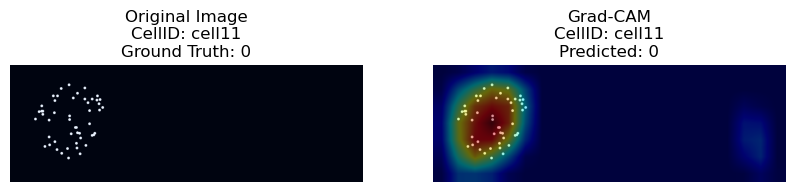

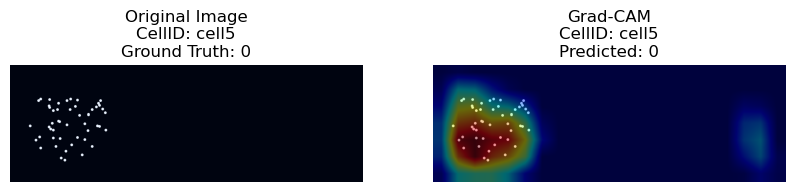

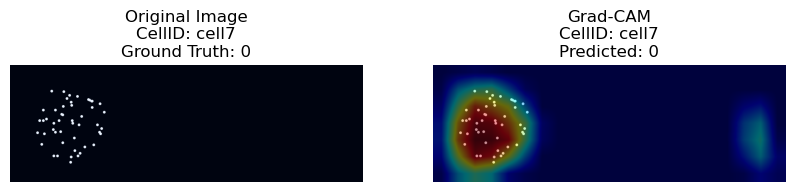

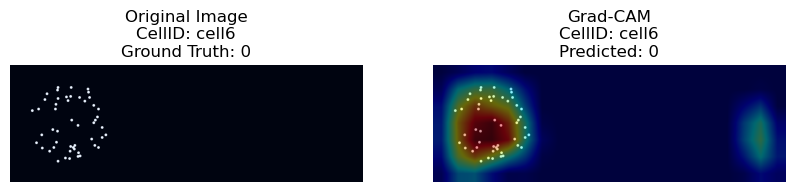

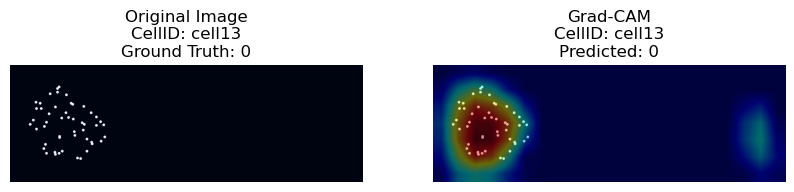

...

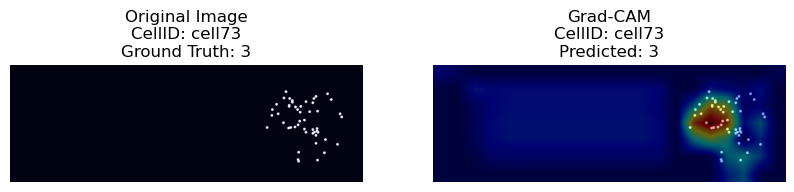

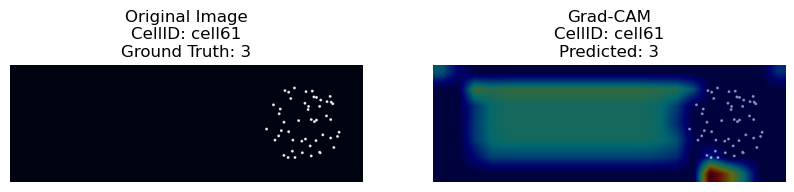

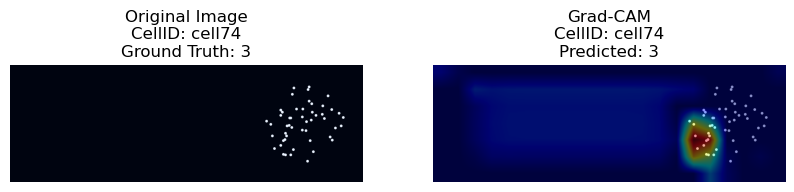

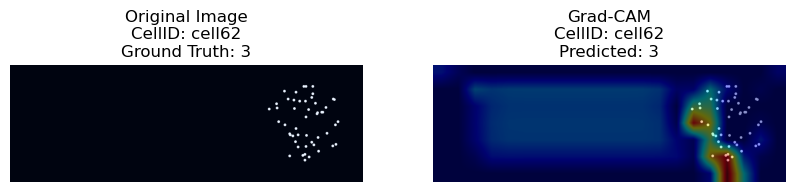

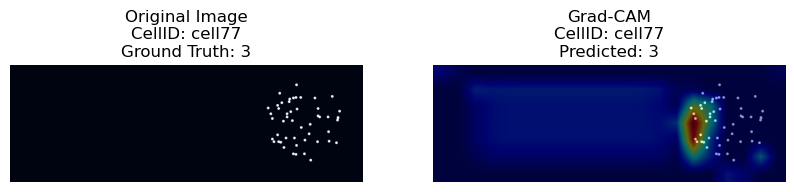

In [98]:
# Select an image from the dataset
for image_idx in range(0, 80):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # For visualization

    # Perform a forward pass and backward pass
    model.eval()
    output = model(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam.generate_heatmap(class_idx)

    # Normalize and prepare original image for visualization
    original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())
    original_image = (original_image * 255).astype(np.uint8)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)

    # Overlay the heatmap on the original image
    overlay = overlay_heatmap(original_image, heatmap)

    # Get ground truth label (from your dataset)
    ground_truth_label = cluster_labels[image_idx].item()

    # Get the corresponding cell ID
    cell_id = file_list[image_idx].split('/')[-1]

    # Plot the original image and the Grad-CAM result with labels and cellID in the title
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Original Image\nCellID: {cell_id}\nGround Truth: {ground_truth_label}")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Grad-CAM\nCellID: {cell_id}\nPredicted: {class_idx}")
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.show()



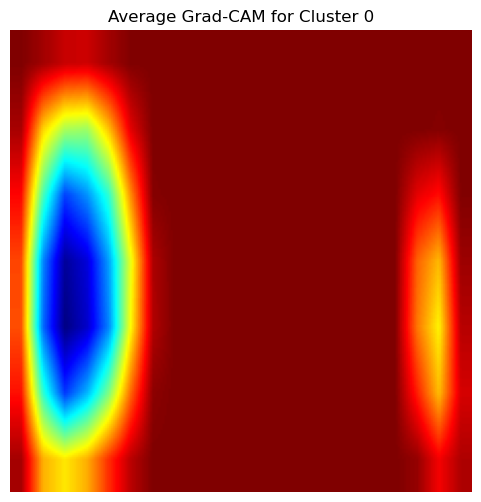

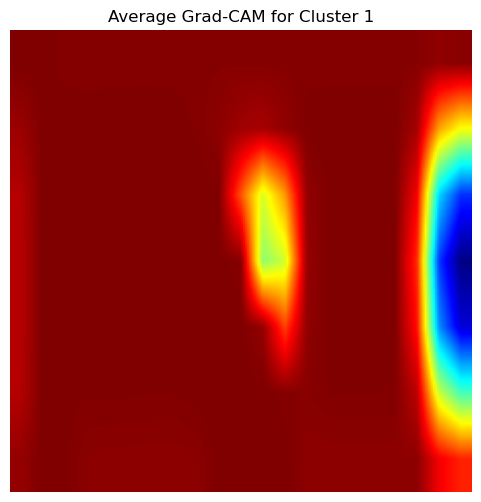

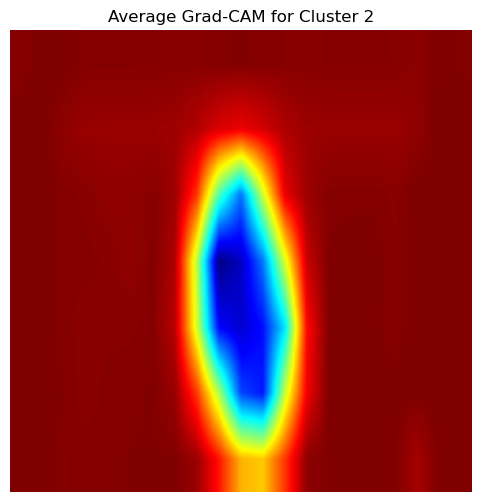

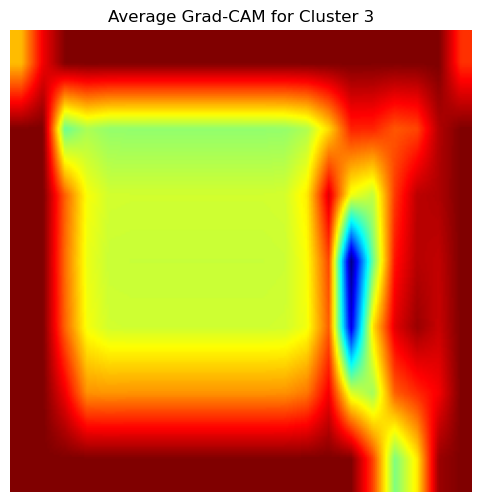

In [99]:
# Dictionary to store heatmaps for each cluster
cluster_heatmaps = {label: [] for label in unique_labels}

for image_idx in range(len(images_all_tensor)):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # Extract original image

    # Forward and backward pass
    model.eval()
    output = model(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam.generate_heatmap(class_idx)

    # Store heatmap in corresponding cluster
    cluster_label = cluster_labels[image_idx].item()
    cluster_heatmaps[cluster_label].append(heatmap)


# Compute and visualize the average heatmap for each cluster
for cluster_label, heatmaps in cluster_heatmaps.items():
    if len(heatmaps) > 0:
        avg_heatmap = np.mean(np.stack(heatmaps), axis=0)  # Compute mean heatmap
        
        # Normalize the heatmap
        avg_heatmap = (avg_heatmap - avg_heatmap.min()) / (avg_heatmap.max() - avg_heatmap.min())

        # Resize and apply colormap
        avg_heatmap = cv2.resize(avg_heatmap, (224, 224))
        avg_heatmap = np.uint8(255 * avg_heatmap)
        avg_heatmap = cv2.applyColorMap(avg_heatmap, cv2.COLORMAP_JET)

        # Display the averaged heatmap
        plt.figure(figsize=(6, 6))
        plt.imshow(avg_heatmap)
        plt.title(f"Average Grad-CAM for Cluster {cluster_label}")
        plt.axis("off")
        plt.show()

In [ ]:
# Remove hooks after execution
gradcam.remove_hooks()

## Grad-CAM++

In [102]:
import torch
import torch.nn.functional as F

class GradCAMPlusPlus:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer

        self.gradients = None
        self.activation = None

        # Register hooks
        self.target_layer.register_forward_hook(self.save_forward)
        self.target_layer.register_backward_hook(self.save_backward)

    def save_forward(self, module, input, output):
        """ Saves the activations (feature maps) during the forward pass """
        self.activation = output

    def save_backward(self, module, grad_input, grad_output):
        """ Saves the gradients (dY/dActivation) during the backward pass """
        self.gradients = grad_output[0]

    def generate_heatmap(self, class_idx):
        """
        Implements the Grad-CAM++ weighting:
            alpha_ij^k = grad_2 / [2*grad_2 + Σ(A^k * grad_3) + ε]
            w^k = Σ_ij( alpha_ij^k * ReLU(grad_ij^k) )
            heatmap = ReLU( Σ_k( w^k * A^k ) )
        """
        # 1) Extract the gradients and activations
        gradient = self.gradients       # shape: (B, C, H, W)
        activation = self.activation    # shape: (B, C, H, W)

        # 2) Compute the necessary gradient powers
        grad_2 = gradient.pow(2)        # Second derivative approximation
        grad_3 = gradient.pow(3)        # Third derivative approximation

        # 3) Compute the alpha coefficient for each pixel
        #    We sum activation * grad_3 over the spatial dimensions for each channel
        #    and then broadcast so we can do elementwise division.
        sum_activations_times_grad_3 = (activation * grad_3).sum(dim=(2,3), keepdim=True)

        # Avoid division by zero
        denominator = 2 * grad_2 + sum_activations_times_grad_3
        denominator = torch.where(denominator != 0, denominator, torch.tensor(1e-10))

        alpha = grad_2 / denominator

        # 4) Compute weights by summing alpha * ReLU(gradient) across spatial dims
        positive_grad = F.relu(gradient)  # Only positive gradients per Grad-CAM++ 
        weights = (alpha * positive_grad).sum(dim=(2,3))  # shape: (B, C)

        # 5) Weight the activations: sum over channels
        #    If your batch size is always 1, you can index [0] below, or handle in a loop
        heatmap = (weights[:, :, None, None] * activation).sum(dim=1)  # shape: (B, H, W)
        heatmap = F.relu(heatmap)  # Focus on positive influences

        # 6) Detach and convert to NumPy (assuming batch size = 1)
        heatmap = heatmap[0].detach().cpu().numpy()

        # 7) Normalize heatmap to [0, 1] for visualization
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
        return heatmap
    
    def remove_hooks(self):
        """Remove registered hooks to prevent memory leaks."""
        self.forward_hook.remove()
        self.backward_hook.remove()

target_layer = model.feature_extractor.layer4[-1]

# Initialize Grad-CAM++
gradcam_pp = GradCAMPlusPlus(model, target_layer)

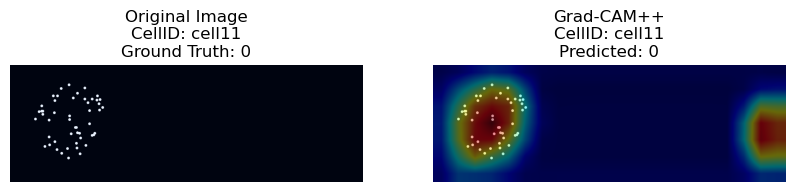

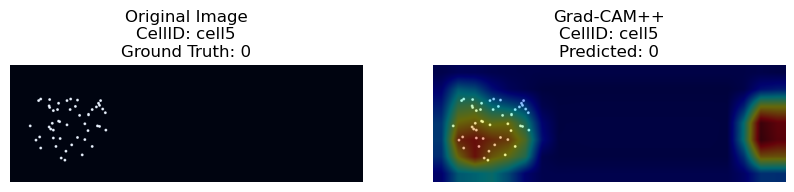

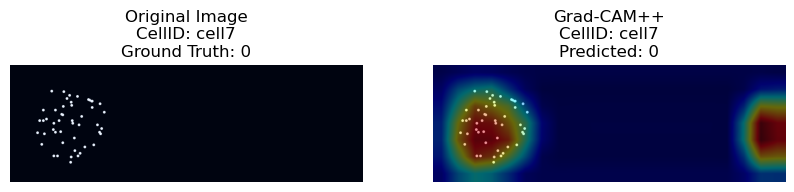

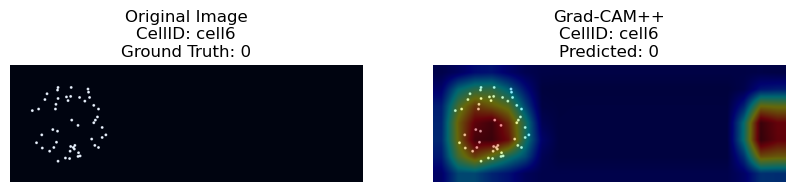

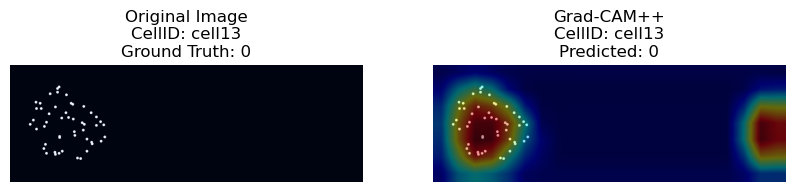

...

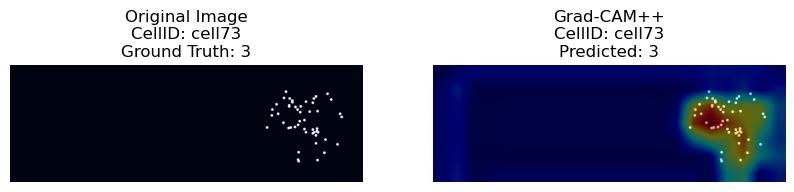

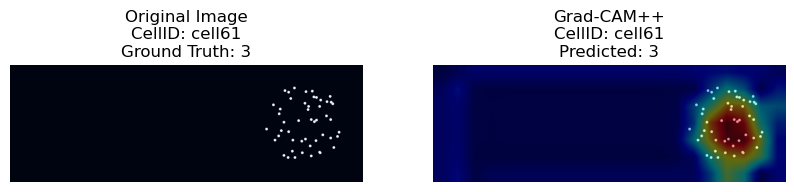

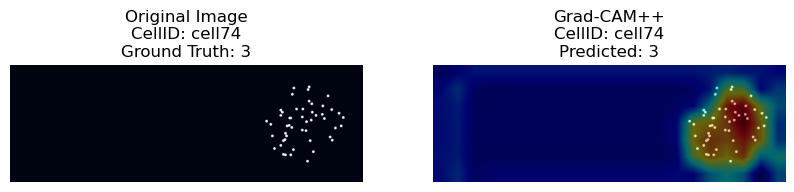

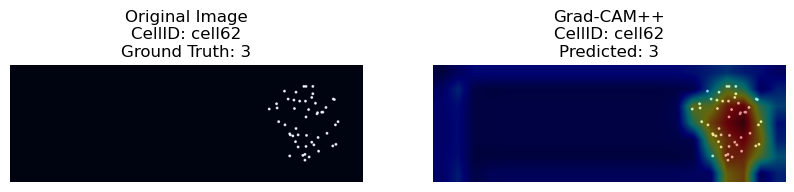

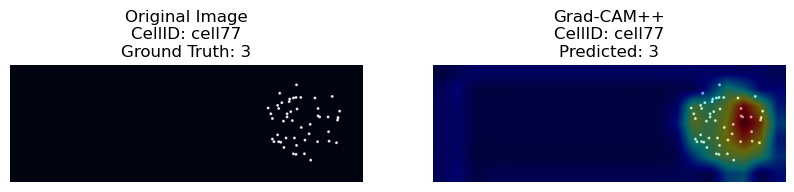

In [103]:
# Select an image from the dataset
for image_idx in range(0, 80):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # For visualization

    # Perform a forward pass and backward pass
    model.eval()
    output = model(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam_pp.generate_heatmap(class_idx)

    # Normalize and prepare original image for visualization
    original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())
    original_image = (original_image * 255).astype(np.uint8)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)

    # Overlay the heatmap on the original image
    overlay = overlay_heatmap(original_image, heatmap)

    # Get ground truth label (from your dataset)
    ground_truth_label = cluster_labels[image_idx].item()

    # Get the corresponding cell ID
    cell_id = file_list[image_idx].split('/')[-1]

    # Plot the original image and the Grad-CAM result with labels and cellID in the title
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Original Image\nCellID: {cell_id}\nGround Truth: {ground_truth_label}")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Grad-CAM++\nCellID: {cell_id}\nPredicted: {class_idx}")
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.show()

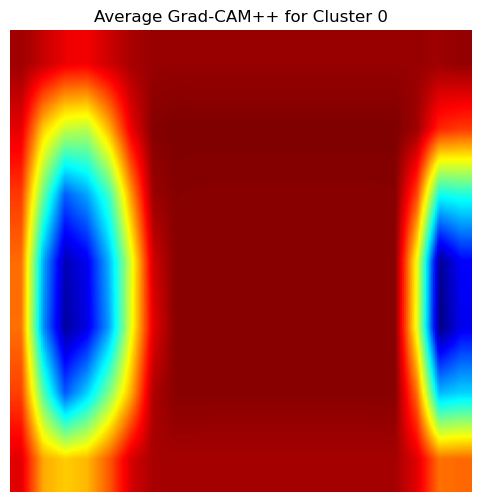

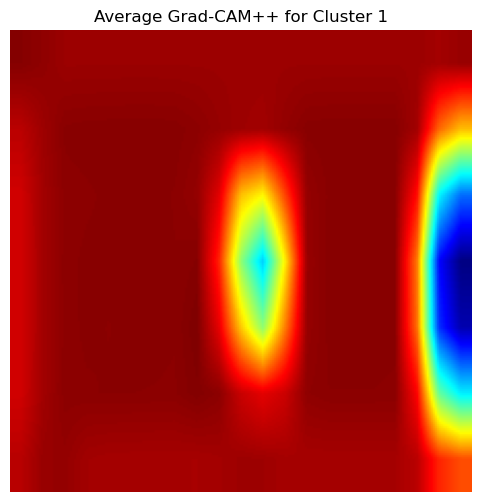

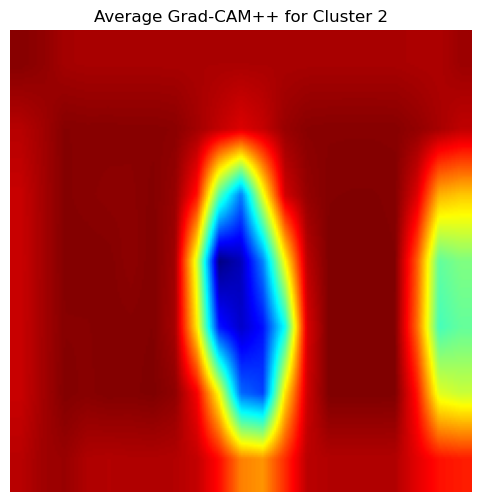

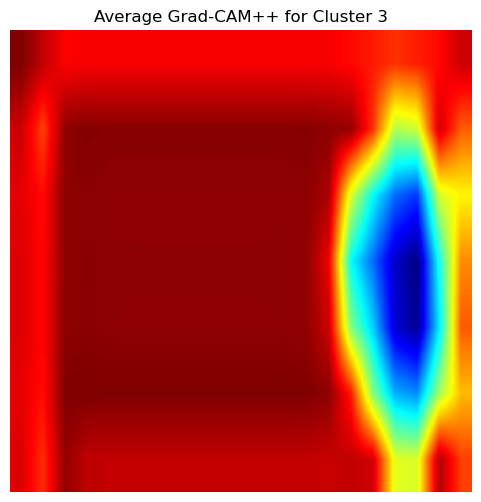

In [105]:
# Dictionary to store heatmaps for each cluster
cluster_heatmaps = {label: [] for label in unique_labels}

for image_idx in range(len(images_all_tensor)):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # Extract original image

    # Forward and backward pass
    model.eval()
    output = model(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam_pp.generate_heatmap(class_idx)

    # Store heatmap in corresponding cluster
    cluster_label = cluster_labels[image_idx].item()
    cluster_heatmaps[cluster_label].append(heatmap)

# Compute and visualize the average heatmap for each cluster
for cluster_label, heatmaps in cluster_heatmaps.items():
    if len(heatmaps) > 0:
        avg_heatmap = np.mean(np.stack(heatmaps), axis=0)  # Compute mean heatmap
        
        # Normalize the heatmap
        avg_heatmap = (avg_heatmap - avg_heatmap.min()) / (avg_heatmap.max() - avg_heatmap.min())

        # Resize and apply colormap
        avg_heatmap = cv2.resize(avg_heatmap, (224, 224))
        avg_heatmap = np.uint8(255 * avg_heatmap)
        avg_heatmap = cv2.applyColorMap(avg_heatmap, cv2.COLORMAP_JET)

        # Display the averaged heatmap
        plt.figure(figsize=(6, 6))
        plt.imshow(avg_heatmap)
        plt.title(f"Average Grad-CAM++ for Cluster {cluster_label}")
        plt.axis("off")
        plt.show()

# Cross-Validation

## reg cross-entropy

In [106]:
class MLPResNetClassifier(pl.LightningModule):
    def __init__(self, num_classes=4, dropout_rate=0.1):
        super().__init__()
        self.feature_extractor = resnet101(weights=None)
        self.feature_extractor.fc = nn.Identity()

        hidden_sizes = [2048, 1024, 512, 256] 
        self.feature_layers = nn.Sequential(
            nn.Linear(hidden_sizes[0], hidden_sizes[1]),
            nn.BatchNorm1d(hidden_sizes[1]), 
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[1], hidden_sizes[2]),
            nn.BatchNorm1d(hidden_sizes[2]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[2], hidden_sizes[3]),
            nn.BatchNorm1d(hidden_sizes[3]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
        )

        self.output = nn.Linear(hidden_sizes[3], num_classes)
        self.criterion = nn.CrossEntropyLoss()

        # For storing per-epoch metrics
        self.epoch_train_losses = []
        self.epoch_val_losses = []
        self.epoch_train_accuracies = []
        self.epoch_val_accuracies = []

        # Temporary storage for batch losses & accuracies during each epoch
        self.train_loss_steps = []
        self.val_loss_steps = []
        self.train_acc_steps = []
        self.val_acc_steps = []

    def forward(self, patches):
        x = self.feature_extractor(patches)
        x = self.feature_layers(x)
        x = self.output(x)
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        preds = torch.argmax(outputs, dim=1)
        accuracy = (preds == labels).float().mean()

        self.log("train_loss", loss, on_epoch=True, prog_bar=True)
        self.log("train_acc", accuracy, prog_bar=True)

        self.train_loss_steps.append(loss.item())
        self.train_acc_steps.append(accuracy.item())
        return loss

    def on_train_epoch_end(self):
        avg_loss = np.mean(self.train_loss_steps)
        avg_acc = np.mean(self.train_acc_steps)

        self.epoch_train_losses.append(avg_loss)
        self.epoch_train_accuracies.append(avg_acc)

        self.log("epoch_train_loss", avg_loss)
        self.log("epoch_train_acc", avg_acc)

        self.train_loss_steps = []
        self.train_acc_steps = []

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        preds = torch.argmax(outputs, dim=1)
        accuracy = (preds == labels).float().mean()

        self.log("val_loss", loss, on_epoch=True, prog_bar=True)
        self.log("val_acc", accuracy, prog_bar=True)

        self.val_loss_steps.append(loss.item())
        self.val_acc_steps.append(accuracy.item())
        return loss

    def on_validation_epoch_end(self):
        avg_loss = np.mean(self.val_loss_steps)
        avg_acc = np.mean(self.val_acc_steps)

        self.epoch_val_losses.append(avg_loss)
        self.epoch_val_accuracies.append(avg_acc)

        self.log("epoch_val_loss", avg_loss)
        self.log("epoch_val_acc", avg_acc)

        self.val_loss_steps = []
        self.val_acc_steps = []

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=0.001)

### K = 5

In [108]:
from pytorch_lightning.callbacks import EarlyStopping
from collections import defaultdict
from torch.utils.data import Subset, DataLoader, TensorDataset
K = 5
skf = StratifiedKFold(n_splits=K, shuffle=True, random_state=42)

# Convert dataset
dataset = TensorDataset(images_all_tensor, cluster_labels)
labels_np = cluster_labels.cpu().numpy()

# Dictionaries to store models, GradCAM instances, and data subsets
train_loss_dict, val_loss_dict = defaultdict(list), defaultdict(list)
train_acc_dict, val_acc_dict = defaultdict(list), defaultdict(list)
models_per_fold, gradcam_per_fold = {}, {}
train_subsets, val_subsets = {}, {}

# Training and GradCAM application per fold
for fold, (train_idx, val_idx) in enumerate(skf.split(images_all_tensor, labels_np)):
    print(f"\n🔹 Fold {fold+1}/{K}")
    print(f"Training samples: {len(train_idx)}, Validation samples: {len(val_idx)}")

    # Store dataset splits
    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)
    train_subsets[f"Fold_{fold+1}"] = train_subset
    val_subsets[f"Fold_{fold+1}"] = val_subset

    # Create DataLoaders
    train_dataloader = DataLoader(train_subset, batch_size=16, shuffle=True)
    val_dataloader = DataLoader(val_subset, batch_size=16, shuffle=False)

    # Early stopping callback
    early_stop_callback = EarlyStopping(
        monitor="epoch_val_loss",  
        patience=5,  
        mode="min",  
        verbose=True  
    )

    # Initialize model
    model = MLPResNetClassifier(num_classes=4).to('cuda')

    trainer = pl.Trainer(
        max_epochs=50, 
        min_epochs=20,
        callbacks=[early_stop_callback],
        enable_checkpointing=False, 
        logger=False
    )

    # Train the model
    trainer.fit(model, train_dataloader, val_dataloader)

    # Store model for later analysis
    models_per_fold[f"Fold_{fold+1}"] = model

    # Store per-epoch loss & accuracy
    train_loss_dict[f"Fold_{fold+1}"] = model.epoch_train_losses
    val_loss_dict[f"Fold_{fold+1}"] = model.epoch_val_losses
    train_acc_dict[f"Fold_{fold+1}"] = model.epoch_train_accuracies
    val_acc_dict[f"Fold_{fold+1}"] = model.epoch_val_accuracies

    # Initialize GradCAM
    target_layer = model.feature_extractor.layer4[-1]  # Use last ResNet layer
    gradcam = GradCAM(model, target_layer)
    gradcam_per_fold[f"Fold_{fold+1}"] = gradcam



🔹 Fold 1/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.393


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.393. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.393. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.393. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.393. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.393. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.393. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.147 >= min_delta = 0.0. New best score: 1.246


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.246. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.246. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.246. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.246. Signaling Trainer to stop.



🔹 Fold 2/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.397


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.397. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.397. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.397. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.397. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.397. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.397. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 1.235 >= min_delta = 0.0. New best score: 0.162


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.086 >= min_delta = 0.0. New best score: 0.077


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.041 >= min_delta = 0.0. New best score: 0.036


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.017 >= min_delta = 0.0. New best score: 0.019


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.006


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.005


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.004



🔹 Fold 3/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.391


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.391. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.391. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.391. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.391. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.391. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.391. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 11 records. Best score: 1.391. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.140 >= min_delta = 0.0. New best score: 1.251


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.251. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.251. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.251. Signaling Trainer to stop.



🔹 Fold 4/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.390


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.390. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.307 >= min_delta = 0.0. New best score: 1.084


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.990 >= min_delta = 0.0. New best score: 0.093


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.093. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 0.093. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 0.093. Signaling Trainer to stop.



🔹 Fold 5/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.392


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.392. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 11 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 12 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 13 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 14 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 15 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 16 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 17 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 18 records. Best score: 1.392. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 19 records. Best score: 1.392. Signaling Trainer to stop.


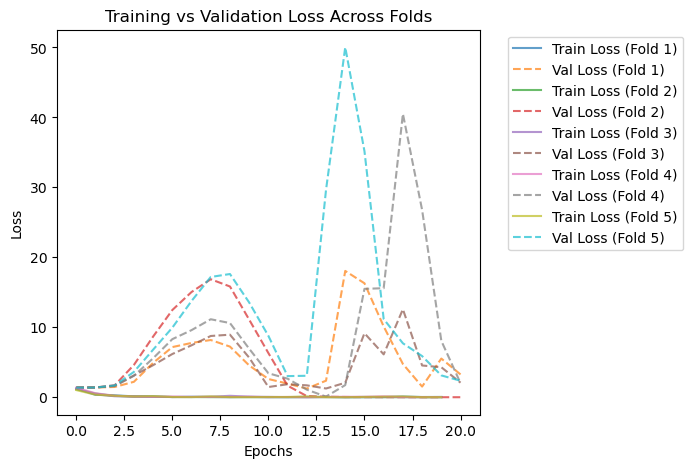

In [109]:
plt.figure(figsize=(12, 5))

# Training & Validation Loss Plot
plt.subplot(1, 2, 1)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_loss_dict[fold_name], label=f"Train Loss (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_loss_dict[fold_name], label=f"Val Loss (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Loss Across Folds")

plt.show()

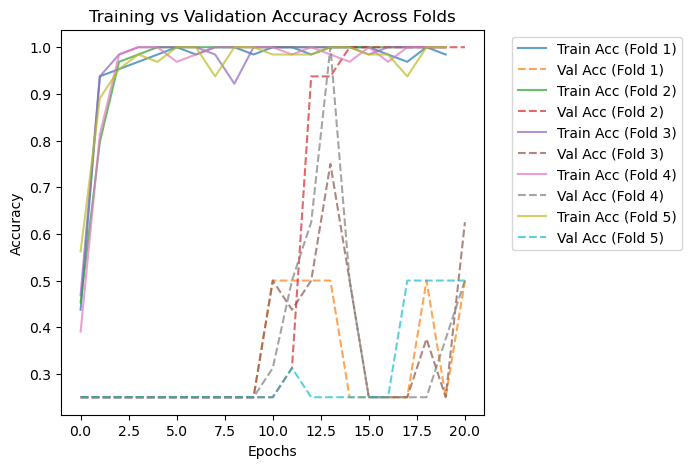

In [110]:
# Training & Validation Accuracy Plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 2)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_acc_dict[fold_name], label=f"Train Acc (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_acc_dict[fold_name], label=f"Val Acc (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Accuracy Across Folds")

plt.show()

### K = 10

In [111]:
from pytorch_lightning.callbacks import EarlyStopping
from collections import defaultdict
from torch.utils.data import Subset, DataLoader, TensorDataset
K = 10
skf = StratifiedKFold(n_splits=K, shuffle=True, random_state=42)

# Convert dataset
dataset = TensorDataset(images_all_tensor, cluster_labels)
labels_np = cluster_labels.cpu().numpy()

# Dictionaries to store models, GradCAM instances, and data subsets
train_loss_dict, val_loss_dict = defaultdict(list), defaultdict(list)
train_acc_dict, val_acc_dict = defaultdict(list), defaultdict(list)
models_per_fold, gradcam_per_fold = {}, {}
train_subsets, val_subsets = {}, {}

# Training and GradCAM application per fold
for fold, (train_idx, val_idx) in enumerate(skf.split(images_all_tensor, labels_np)):
    print(f"\n🔹 Fold {fold+1}/{K}")
    print(f"Training samples: {len(train_idx)}, Validation samples: {len(val_idx)}")

    # Store dataset splits
    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)
    train_subsets[f"Fold_{fold+1}"] = train_subset
    val_subsets[f"Fold_{fold+1}"] = val_subset

    # Create DataLoaders
    train_dataloader = DataLoader(train_subset, batch_size=16, shuffle=True)
    val_dataloader = DataLoader(val_subset, batch_size=16, shuffle=False)

    # Early stopping callback
    early_stop_callback = EarlyStopping(
        monitor="epoch_val_loss",  
        patience=5,  
        mode="min",  
        verbose=True  
    )

    # Initialize model
    model = MLPResNetClassifier(num_classes=4).to('cuda')

    trainer = pl.Trainer(
        max_epochs=100, 
        min_epochs=20,
        callbacks=[early_stop_callback],
        enable_checkpointing=False, 
        logger=False
    )

    # Train the model
    trainer.fit(model, train_dataloader, val_dataloader)

    # Store model for later analysis
    models_per_fold[f"Fold_{fold+1}"] = model

    # Store per-epoch loss & accuracy
    train_loss_dict[f"Fold_{fold+1}"] = model.epoch_train_losses
    val_loss_dict[f"Fold_{fold+1}"] = model.epoch_val_losses
    train_acc_dict[f"Fold_{fold+1}"] = model.epoch_train_accuracies
    val_acc_dict[f"Fold_{fold+1}"] = model.epoch_val_accuracies

    # Initialize GradCAM
    target_layer = model.feature_extractor.layer4[-1]  # Use last ResNet layer
    gradcam = GradCAM(model, target_layer)
    gradcam_per_fold[f"Fold_{fold+1}"] = gradcam



🔹 Fold 1/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.402


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.402. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.402. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.133 >= min_delta = 0.0. New best score: 1.270


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.027 >= min_delta = 0.0. New best score: 1.243


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.986 >= min_delta = 0.0. New best score: 0.256


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.256. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 0.256. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 0.256. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 0.256. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.237


Validation: |          | 0/? [00:00<?, ?it/s]


🔹 Fold 2/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.414


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.414. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.414. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.414. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.412


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 1.141 >= min_delta = 0.0. New best score: 0.271


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.271. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 0.271. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 0.271. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 0.271. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 0.271. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.255 >= min_delta = 0.0. New best score: 0.016



🔹 Fold 3/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.400


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.400. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.400. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.400. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.400. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.513 >= min_delta = 0.0. New best score: 0.887


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.164 >= min_delta = 0.0. New best score: 0.723


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.589 >= min_delta = 0.0. New best score: 0.134


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


🔹 Fold 4/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.411


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.411. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.411. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.411. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.458 >= min_delta = 0.0. New best score: 0.952


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.612 >= min_delta = 0.0. New best score: 0.340


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.252 >= min_delta = 0.0. New best score: 0.088


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.053 >= min_delta = 0.0. New best score: 0.035


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.035. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 0.035. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 0.035. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 0.035. Signaling Trainer to stop.



🔹 Fold 5/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.414


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.414. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.414. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.363 >= min_delta = 0.0. New best score: 1.051


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.082 >= min_delta = 0.0. New best score: 0.969


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.845 >= min_delta = 0.0. New best score: 0.124


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.033 >= min_delta = 0.0. New best score: 0.091


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.091. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 0.091. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 0.091. Signaling Trainer to stop.



🔹 Fold 6/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.390


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.390. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.390. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.025 >= min_delta = 0.0. New best score: 1.365


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 1.157 >= min_delta = 0.0. New best score: 0.208


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.208. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 0.208. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 0.208. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 0.208. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 0.208. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.208. Signaling Trainer to stop.



🔹 Fold 7/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.428


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.428. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 11 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 12 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 13 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 14 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 15 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 16 records. Best score: 1.428. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.209 >= min_delta = 0.0. New best score: 1.219


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 1.099 >= min_delta = 0.0. New best score: 0.120


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.078 >= min_delta = 0.0. New best score: 0.042



🔹 Fold 8/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.389


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.389. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 11 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 12 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.388


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.862 >= min_delta = 0.0. New best score: 0.525


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.525. Signaling Trainer to stop.



🔹 Fold 9/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.395


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.395. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.395. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.395. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.395. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.336 >= min_delta = 0.0. New best score: 1.059


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.184 >= min_delta = 0.0. New best score: 0.874


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.461 >= min_delta = 0.0. New best score: 0.413


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.329 >= min_delta = 0.0. New best score: 0.084


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 0.084. Signaling Trainer to stop.



🔹 Fold 10/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.431


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 5 records. Best score: 1.431. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 6 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 7 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 8 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 9 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 11 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 12 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 13 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 14 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 15 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 16 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 17 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 18 records. Best score: 1.431. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 19 records. Best score: 1.431. Signaling Trainer to stop.


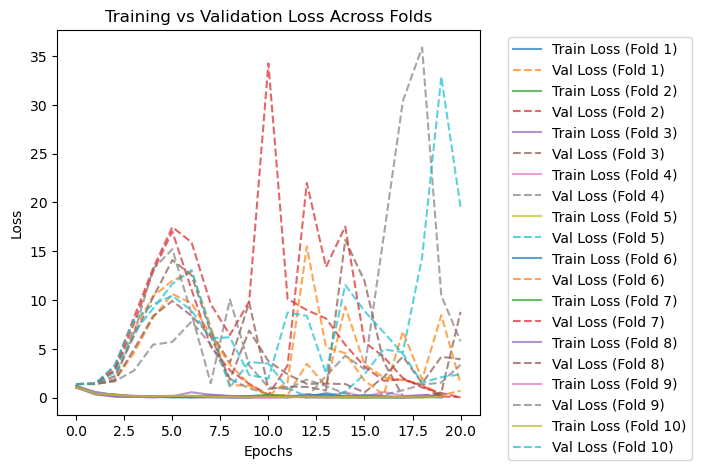

In [112]:
plt.figure(figsize=(12, 5))

# Training & Validation Loss Plot
plt.subplot(1, 2, 1)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_loss_dict[fold_name], label=f"Train Loss (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_loss_dict[fold_name], label=f"Val Loss (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Loss Across Folds")

plt.show()

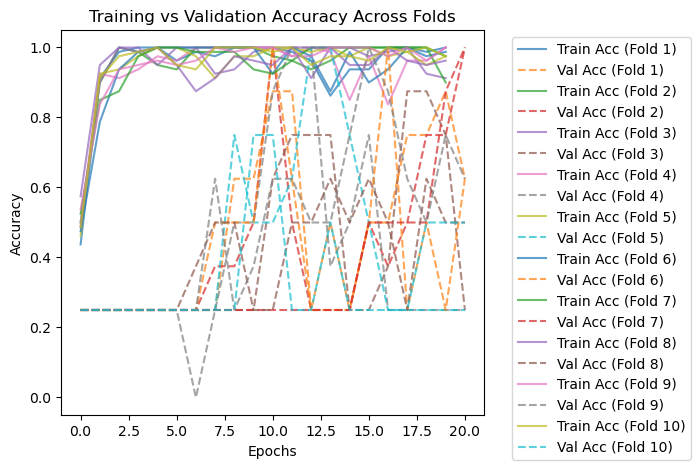

In [113]:
# Training & Validation Accuracy Plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 2)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_acc_dict[fold_name], label=f"Train Acc (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_acc_dict[fold_name], label=f"Val Acc (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Accuracy Across Folds")

plt.show()

In [114]:
from collections import Counter

for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(labels_np)), labels_np)):
    train_labels = labels_np[train_idx]  # Extract training labels
    val_labels = labels_np[val_idx]  # Extract validation labels

    train_class_counts = Counter(train_labels)
    val_class_counts = Counter(val_labels)

    print(f"\n🔹 Fold {fold+1}/{K}")
    print(f"Train Class Distribution: {dict(train_class_counts)}")
    print(f"Val Class Distribution: {dict(val_class_counts)}")



🔹 Fold 1/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 2/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 3/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 4/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 5/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 6/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 7/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 8/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 18}
Val Class Distribution: {0: 2, 1: 2, 2: 2, 3: 2}

🔹 Fold 9/10
Train Class Distribution: {0: 18, 1: 18, 2: 18, 3: 

## class weights criterion

In [115]:
class MLPResNetClassifier(pl.LightningModule):
    def __init__(self, num_classes=4, dropout_rate=0.1, class_weights=None):
        super().__init__()
        self.feature_extractor = resnet101(weights=None)
        self.feature_extractor.fc = nn.Identity()

        hidden_sizes = [2048, 1024, 512, 256] 
        self.feature_layers = nn.Sequential(
            nn.Linear(hidden_sizes[0], hidden_sizes[1]),
            nn.BatchNorm1d(hidden_sizes[1]), 
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[1], hidden_sizes[2]),
            nn.BatchNorm1d(hidden_sizes[2]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[2], hidden_sizes[3]),
            nn.BatchNorm1d(hidden_sizes[3]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
        )

        self.output = nn.Linear(hidden_sizes[3], num_classes)
        self.criterion = nn.CrossEntropyLoss(weight=class_weights)

        # For storing per-epoch metrics
        self.epoch_train_losses = []
        self.epoch_val_losses = []
        self.epoch_train_accuracies = []
        self.epoch_val_accuracies = []

        # Temporary storage for batch losses & accuracies during each epoch
        self.train_loss_steps = []
        self.val_loss_steps = []
        self.train_acc_steps = []
        self.val_acc_steps = []

    def forward(self, patches):
        x = self.feature_extractor(patches)
        x = self.feature_layers(x)
        x = self.output(x)
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        preds = torch.argmax(outputs, dim=1)
        accuracy = (preds == labels).float().mean()

        self.log("train_loss", loss, on_epoch=True, prog_bar=True)
        self.log("train_acc", accuracy, prog_bar=True)

        self.train_loss_steps.append(loss.item())
        self.train_acc_steps.append(accuracy.item())
        return loss

    def on_train_epoch_end(self):
        avg_loss = np.mean(self.train_loss_steps)
        avg_acc = np.mean(self.train_acc_steps)

        self.epoch_train_losses.append(avg_loss)
        self.epoch_train_accuracies.append(avg_acc)

        self.log("epoch_train_loss", avg_loss)
        self.log("epoch_train_acc", avg_acc)

        self.train_loss_steps = []
        self.train_acc_steps = []

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        preds = torch.argmax(outputs, dim=1)
        accuracy = (preds == labels).float().mean()

        self.log("val_loss", loss, on_epoch=True, prog_bar=True)
        self.log("val_acc", accuracy, prog_bar=True)

        self.val_loss_steps.append(loss.item())
        self.val_acc_steps.append(accuracy.item())
        return loss

    def on_validation_epoch_end(self):
        avg_loss = np.mean(self.val_loss_steps)
        avg_acc = np.mean(self.val_acc_steps)

        self.epoch_val_losses.append(avg_loss)
        self.epoch_val_accuracies.append(avg_acc)

        self.log("epoch_val_loss", avg_loss)
        self.log("epoch_val_acc", avg_acc)

        self.val_loss_steps = []
        self.val_acc_steps = []

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=0.001)

### K = 5

In [116]:
from sklearn.utils.class_weight import compute_class_weight
K = 5
skf = StratifiedKFold(n_splits=K, shuffle=True, random_state=42)

# Convert dataset
dataset = TensorDataset(images_all_tensor, cluster_labels)
labels_np = cluster_labels.cpu().numpy()

# Dictionaries to store models, GradCAM instances, and data subsets
train_loss_dict, val_loss_dict = defaultdict(list), defaultdict(list)
train_acc_dict, val_acc_dict = defaultdict(list), defaultdict(list)
models_per_fold, gradcam_per_fold = {}, {}
train_subsets, val_subsets = {}, {}

# Training and GradCAM application per fold
for fold, (train_idx, val_idx) in enumerate(skf.split(images_all_tensor, labels_np)):
    print(f"\n🔹 Fold {fold+1}/{K}")
    print(f"Training samples: {len(train_idx)}, Validation samples: {len(val_idx)}")

    # Store dataset splits
    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)
    train_subsets[f"Fold_{fold+1}"] = train_subset
    val_subsets[f"Fold_{fold+1}"] = val_subset

    # Create DataLoaders
    train_dataloader = DataLoader(train_subset, batch_size=16, shuffle=True)
    val_dataloader = DataLoader(val_subset, batch_size=16, shuffle=False)

    # Early stopping callback
    early_stop_callback = EarlyStopping(
        monitor="epoch_val_loss",  
        patience=10,  
        mode="min",  
        verbose=True  
    )

    # Compute class weights based on dataset labels
    class_weights = compute_class_weight(
        class_weight="balanced",
        classes=np.unique(labels_np),
        y=labels_np
    )
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to("cuda")

    # Initialize model
    model = MLPResNetClassifier(num_classes=4).to('cuda')
    model.criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainer = pl.Trainer(
        max_epochs=100, 
        min_epochs=20,
        callbacks=[early_stop_callback],
        enable_checkpointing=False, 
        logger=False
    )

    # Train the model
    trainer.fit(model, train_dataloader, val_dataloader)

    # Store model for later analysis
    models_per_fold[f"Fold_{fold+1}"] = model

    # Store per-epoch loss & accuracy
    train_loss_dict[f"Fold_{fold+1}"] = model.epoch_train_losses
    val_loss_dict[f"Fold_{fold+1}"] = model.epoch_val_losses
    train_acc_dict[f"Fold_{fold+1}"] = model.epoch_train_accuracies
    val_acc_dict[f"Fold_{fold+1}"] = model.epoch_val_accuracies

    # Initialize GradCAM
    target_layer = model.feature_extractor.layer4[-1]  # Use last ResNet layer
    gradcam = GradCAM(model, target_layer)
    gradcam_per_fold[f"Fold_{fold+1}"] = gradcam


🔹 Fold 1/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.389


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.389. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 11 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 12 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 13 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 14 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 15 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 16 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 17 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 18 records. Best score: 1.389. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.130 >= min_delta = 0.0. New best score: 1.258



🔹 Fold 2/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.388


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.681 >= min_delta = 0.0. New best score: 0.707


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.553 >= min_delta = 0.0. New best score: 0.153


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.047 >= min_delta = 0.0. New best score: 0.107


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.056 >= min_delta = 0.0. New best score: 0.051


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.038


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.027


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.007


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.007. Signaling Trainer to stop.



🔹 Fold 3/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.400


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.715 >= min_delta = 0.0. New best score: 0.685


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.643 >= min_delta = 0.0. New best score: 0.042


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.028


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.027


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.017


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.007


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.007. Signaling Trainer to stop.



🔹 Fold 4/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.394


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.394. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.899 >= min_delta = 0.0. New best score: 0.495


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


🔹 Fold 5/5
Training samples: 64, Validation samples: 16


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.400


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 1.400. Signaling Trainer to stop.
Trainer was signaled to stop but the required `min_epochs=20` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.267 >= min_delta = 0.0. New best score: 1.133


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.760 >= min_delta = 0.0. New best score: 0.373


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.264 >= min_delta = 0.0. New best score: 0.109


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.074 >= min_delta = 0.0. New best score: 0.035


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.021


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.018


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

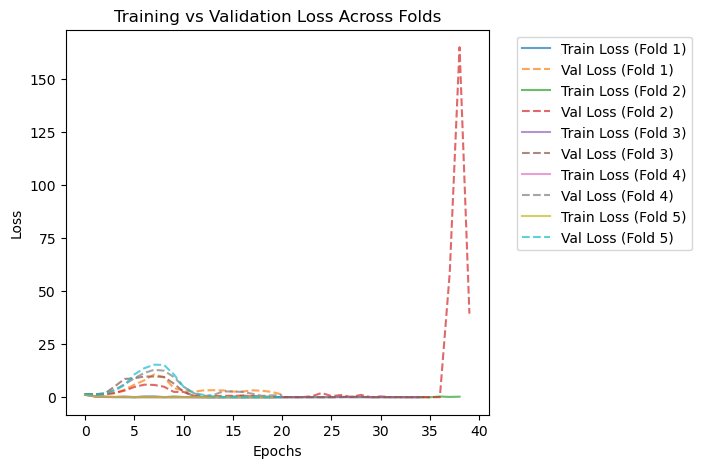

In [117]:
plt.figure(figsize=(12, 5))

# Training & Validation Loss Plot
plt.subplot(1, 2, 1)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_loss_dict[fold_name], label=f"Train Loss (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_loss_dict[fold_name], label=f"Val Loss (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Loss Across Folds")

plt.show()

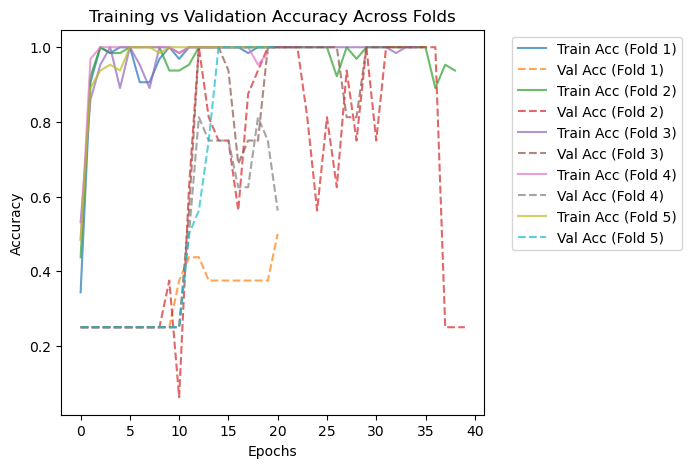

In [118]:
# Training & Validation Accuracy Plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 2)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_acc_dict[fold_name], label=f"Train Acc (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_acc_dict[fold_name], label=f"Val Acc (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Accuracy Across Folds")

plt.show()

### K = 10

In [120]:
from sklearn.utils.class_weight import compute_class_weight
K = 10
skf = StratifiedKFold(n_splits=K, shuffle=True, random_state=42)

# Convert dataset
dataset = TensorDataset(images_all_tensor, cluster_labels)
labels_np = cluster_labels.cpu().numpy()

# Dictionaries to store models, GradCAM instances, and data subsets
train_loss_dict, val_loss_dict = defaultdict(list), defaultdict(list)
train_acc_dict, val_acc_dict = defaultdict(list), defaultdict(list)
models_per_fold, gradcam_per_fold = {}, {}
train_subsets, val_subsets = {}, {}

# Training and GradCAM application per fold
for fold, (train_idx, val_idx) in enumerate(skf.split(images_all_tensor, labels_np)):
    print(f"\n🔹 Fold {fold+1}/{K}")
    print(f"Training samples: {len(train_idx)}, Validation samples: {len(val_idx)}")

    # Store dataset splits
    train_subset = Subset(dataset, train_idx)
    val_subset = Subset(dataset, val_idx)
    train_subsets[f"Fold_{fold+1}"] = train_subset
    val_subsets[f"Fold_{fold+1}"] = val_subset

    # Create DataLoaders
    train_dataloader = DataLoader(train_subset, batch_size=16, shuffle=True)
    val_dataloader = DataLoader(val_subset, batch_size=16, shuffle=False)

    # Early stopping callback
    early_stop_callback = EarlyStopping(
        monitor="epoch_val_loss",  
        patience=10,  
        mode="min",  
        verbose=True  
    )

    # Compute class weights based on dataset labels
    class_weights = compute_class_weight(
        class_weight="balanced",
        classes=np.unique(labels_np),
        y=labels_np
    )
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to("cuda")

    # Initialize model
    model = MLPResNetClassifier(num_classes=4).to('cuda')
    model.criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainer = pl.Trainer(
        max_epochs=100, 
        min_epochs=20,
        callbacks=[early_stop_callback],
        enable_checkpointing=False, 
        logger=False
    )

    # Train the model
    trainer.fit(model, train_dataloader, val_dataloader)

    # Store model for later analysis
    models_per_fold[f"Fold_{fold+1}"] = model

    # Store per-epoch loss & accuracy
    train_loss_dict[f"Fold_{fold+1}"] = model.epoch_train_losses
    val_loss_dict[f"Fold_{fold+1}"] = model.epoch_val_losses
    train_acc_dict[f"Fold_{fold+1}"] = model.epoch_train_accuracies
    val_acc_dict[f"Fold_{fold+1}"] = model.epoch_val_accuracies

    # Initialize GradCAM
    target_layer = model.feature_extractor.layer4[-1]  # Use last ResNet layer
    gradcam = GradCAM(model, target_layer)
    gradcam_per_fold[f"Fold_{fold+1}"] = gradcam


🔹 Fold 1/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.428


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.184 >= min_delta = 0.0. New best score: 1.243


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.692 >= min_delta = 0.0. New best score: 0.551


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.539 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.012. Signaling Trainer to stop.



🔹 Fold 2/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.392


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.459 >= min_delta = 0.0. New best score: 0.933


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.743 >= min_delta = 0.0. New best score: 0.190


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.046 >= min_delta = 0.0. New best score: 0.144


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.108 >= min_delta = 0.0. New best score: 0.037


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.037. Signaling Trainer to stop.



🔹 Fold 3/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.401


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.571 >= min_delta = 0.0. New best score: 0.830


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.314 >= min_delta = 0.0. New best score: 0.516


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.486 >= min_delta = 0.0. New best score: 0.031


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.022


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.010


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.005


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.005. Signaling Trainer to stop.



🔹 Fold 4/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.397


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.352 >= min_delta = 0.0. New best score: 1.045


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.948 >= min_delta = 0.0. New best score: 0.096


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.096. Signaling Trainer to stop.



🔹 Fold 5/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.405


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.205 >= min_delta = 0.0. New best score: 1.200


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.258 >= min_delta = 0.0. New best score: 0.942


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.452 >= min_delta = 0.0. New best score: 0.489


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.358 >= min_delta = 0.0. New best score: 0.131


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.109 >= min_delta = 0.0. New best score: 0.022


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.022. Signaling Trainer to stop.



🔹 Fold 6/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.396


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 1.243 >= min_delta = 0.0. New best score: 0.153


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.125 >= min_delta = 0.0. New best score: 0.028


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.017


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.017. Signaling Trainer to stop.



🔹 Fold 7/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.406


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.110 >= min_delta = 0.0. New best score: 1.296


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.544 >= min_delta = 0.0. New best score: 0.752


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.470 >= min_delta = 0.0. New best score: 0.283


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.156 >= min_delta = 0.0. New best score: 0.127


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.113 >= min_delta = 0.0. New best score: 0.014


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.014. Signaling Trainer to stop.



🔹 Fold 8/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.390


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.278 >= min_delta = 0.0. New best score: 1.112


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.333 >= min_delta = 0.0. New best score: 0.780


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.612 >= min_delta = 0.0. New best score: 0.168


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.091 >= min_delta = 0.0. New best score: 0.077


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.046 >= min_delta = 0.0. New best score: 0.031


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.003


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.003. Signaling Trainer to stop.



🔹 Fold 9/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.405


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.306 >= min_delta = 0.0. New best score: 1.099


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.160 >= min_delta = 0.0. New best score: 0.939


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.794 >= min_delta = 0.0. New best score: 0.145


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.118 >= min_delta = 0.0. New best score: 0.027


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.021


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.021. Signaling Trainer to stop.



🔹 Fold 10/10
Training samples: 72, Validation samples: 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved. New best score: 1.390


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.904 >= min_delta = 0.0. New best score: 0.486


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.121 >= min_delta = 0.0. New best score: 0.365


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.354


Validation: |          | 0/? [00:00<?, ?it/s]

Metric epoch_val_loss improved by 0.218 >= min_delta = 0.0. New best score: 0.136


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric epoch_val_loss did not improve in the last 10 records. Best score: 0.136. Signaling Trainer to stop.


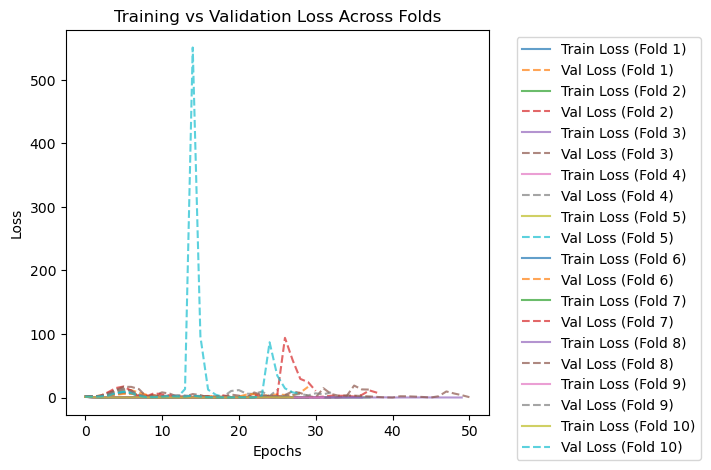

In [121]:
plt.figure(figsize=(12, 5))

# Training & Validation Loss Plot
plt.subplot(1, 2, 1)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_loss_dict[fold_name], label=f"Train Loss (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_loss_dict[fold_name], label=f"Val Loss (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Loss Across Folds")

plt.show()

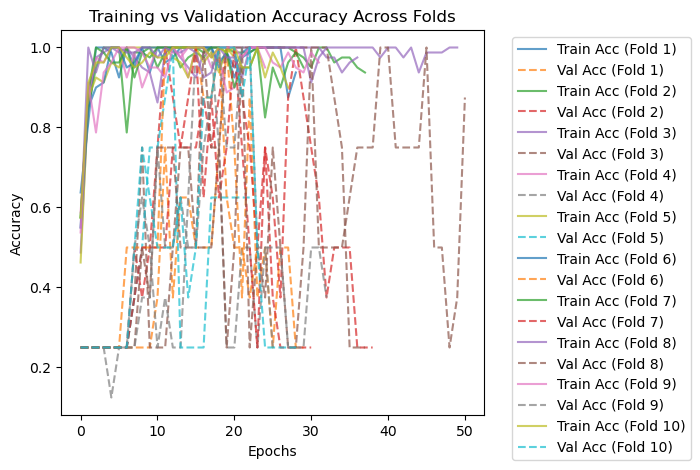

In [122]:
# Training & Validation Accuracy Plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 2)
for fold in range(K):
    fold_name = f"Fold_{fold+1}"
    plt.plot(train_acc_dict[fold_name], label=f"Train Acc (Fold {fold+1})", linestyle="-", alpha=0.7)
    plt.plot(val_acc_dict[fold_name], label=f"Val Acc (Fold {fold+1})", linestyle="--", alpha=0.7)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Training vs Validation Accuracy Across Folds")

plt.show()

# Feature Extraction with Weighted Criterion

In [123]:
cluster_labels

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')

In [124]:
from sklearn.utils.class_weight import compute_class_weight

# Compute class weights
num_classes = 4  # Adjust based on your dataset
class_counts = torch.bincount(cluster_labels)  # Count occurrences of each class
class_weights = compute_class_weight('balanced', classes=np.arange(num_classes), y=cluster_labels.cpu().numpy())
class_weights = torch.tensor(class_weights, dtype=torch.float32, device='cuda')

In [125]:
class_counts

tensor([20, 20, 20, 20], device='cuda:0')

In [130]:
class_weights

tensor([1., 1., 1., 1.], device='cuda:0')

### Weighted Criterion

In [ ]:
# Define the modified MLP classifier
from RESNET101 import resnet101, ResNet101_Weights
class MLPResNetClassifier(pl.LightningModule):
    def __init__(self, num_classes=4, dropout_rate=0.1, class_weights=None):
        super().__init__()
        # Feature extractor (ResNet50)
        self.feature_extractor = resnet101(weights=ResNet101_Weights.DEFAULT)
        self.feature_extractor.fc = nn.Identity()  # Remove the final classification layer

        # Fully connected layers (MLP)
        hidden_sizes = [2048, 1024, 512, 256] 
        self.feature_layers = nn.Sequential(
            nn.Linear(hidden_sizes[0], hidden_sizes[1]),
            nn.BatchNorm1d(hidden_sizes[1]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[1], hidden_sizes[2]),
            nn.BatchNorm1d(hidden_sizes[2]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[2], hidden_sizes[3]),
            nn.BatchNorm1d(hidden_sizes[3]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
        )

        # Output layer
        self.output = nn.Linear(hidden_sizes[3], num_classes)

        # Loss function
        self.criterion = nn.CrossEntropyLoss(weight=class_weights)

    def forward(self, patches):
        # Extract features using ResNet50
        x = self.feature_extractor(patches)
        x = self.feature_layers(x)  # Pass through MLP
        x = self.output(x)  # Output classification scores
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=0.001)

# Prepare data
images_all_tensor = images_all_tensor.to('cuda')
cluster_labels = cluster_labels.to('cuda')
dataset = TensorDataset(images_all_tensor, cluster_labels)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

# Initialize model
model2 = MLPResNetClassifier(num_classes=4, class_weights=class_weights.to('cuda'))
model2 = model2.to('cuda')

# Initialize PyTorch Lightning Trainer
trainer = Trainer(max_epochs=12)

# Train the model
trainer.fit(model2, dataloader)

# Evaluation function
def evaluate_model(model, dataloader):
    model.eval()  # Set model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, labels in dataloader:
            images, labels = images.to('cpu'), labels.to('cpu')  # Move data to GPU
            outputs = model(images)  # Get model predictions
            _, predicted = torch.max(outputs, 1)  # Get predicted class
            total += labels.size(0)
            correct += (predicted == labels).sum().item()  # Count correct predictions

    accuracy = 100 * correct / total
    return accuracy


# Create a test DataLoader
test_dataset = TensorDataset(images_all_tensor, cluster_labels)  # Replace with test tensors
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Evaluate the model
accuracy = evaluate_model(model2, test_dataloader)
print(f"Model Accuracy: {accuracy:.2f}%")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=12` reached.


Model Accuracy: 100.00%


In [127]:
target_layer = model2.feature_extractor.layer4[-1]

# Initialize Grad-CAM
gradcam2 = GradCAM(model2, target_layer)

/home/deev/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


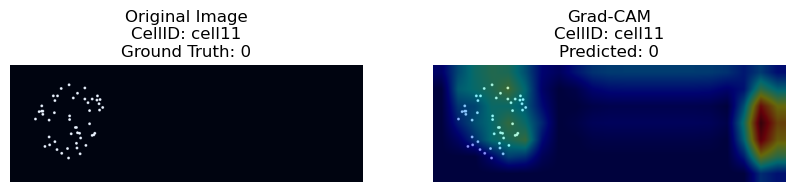

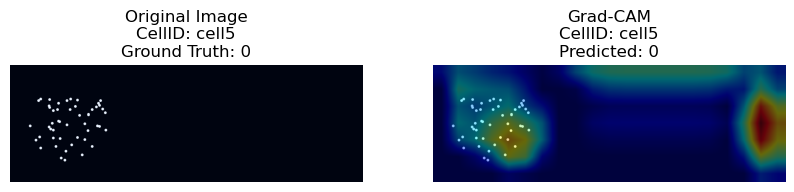

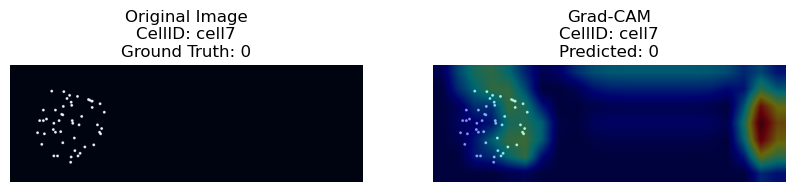

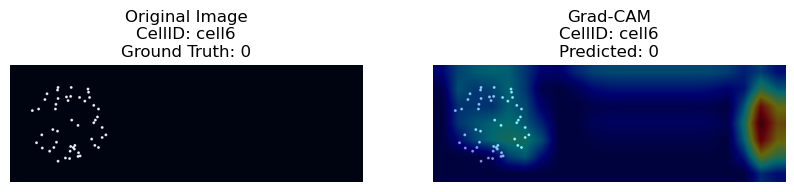

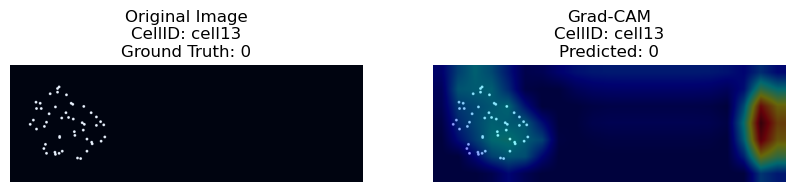

...

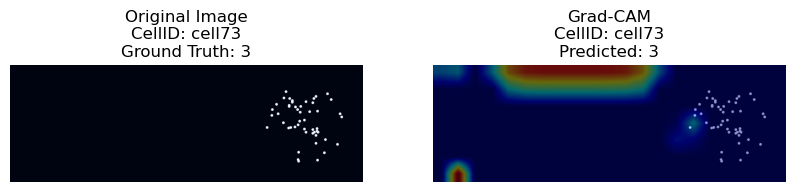

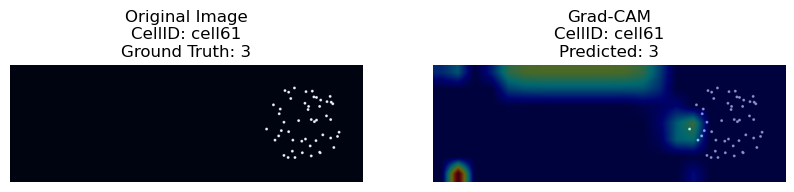

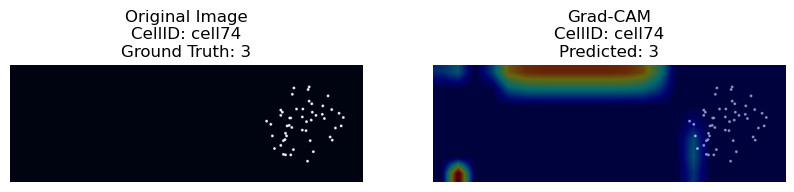

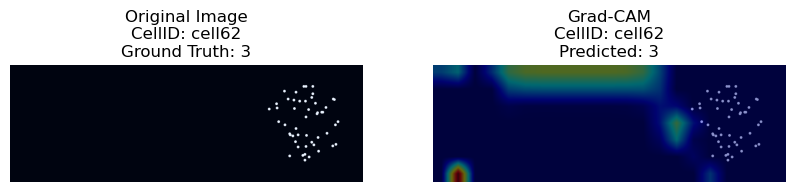

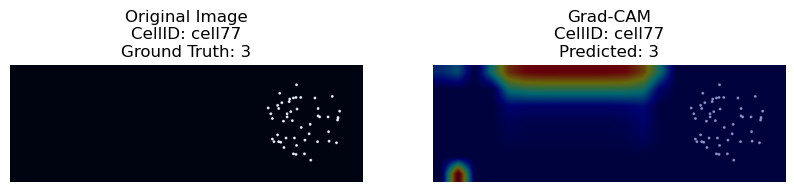

In [128]:
# Select an image from the dataset
for image_idx in range(0, 80):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # For visualization

    # Perform a forward pass and backward pass
    model2.eval()
    output = model2(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model2.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam2.generate_heatmap(class_idx)

    # Normalize and prepare original image for visualization
    original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())
    original_image = (original_image * 255).astype(np.uint8)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)

    # Overlay the heatmap on the original image
    overlay = overlay_heatmap(original_image, heatmap)

    # Get ground truth label (from your dataset)
    ground_truth_label = cluster_labels[image_idx].item()

    # Get the corresponding cell ID
    cell_id = file_list[image_idx].split('/')[-1]

    # Plot the original image and the Grad-CAM result with labels and cellID in the title
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Original Image\nCellID: {cell_id}\nGround Truth: {ground_truth_label}")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Grad-CAM\nCellID: {cell_id}\nPredicted: {class_idx}")
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.show()

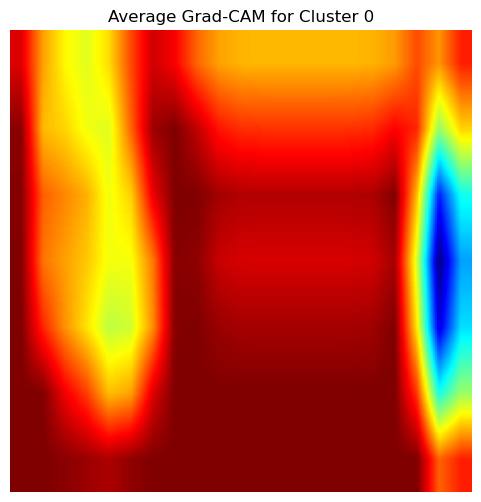

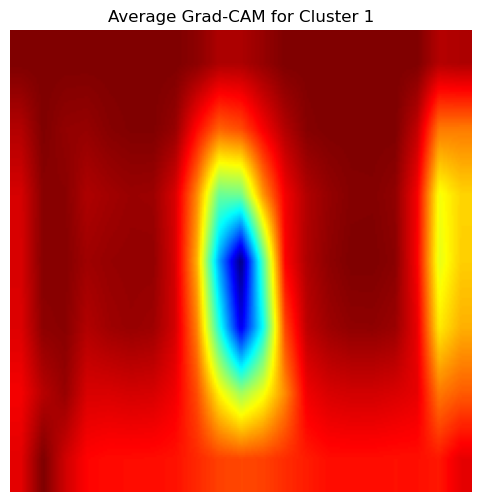

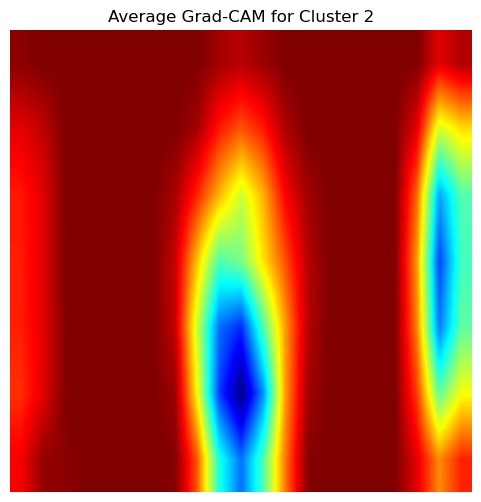

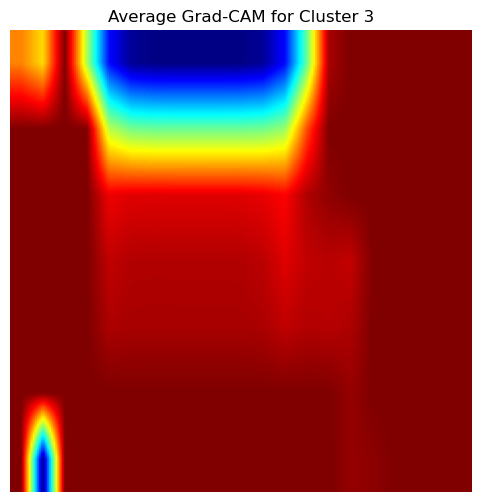

In [129]:
# Dictionary to store heatmaps for each cluster
cluster_heatmaps = {label: [] for label in unique_labels}

for image_idx in range(len(images_all_tensor)):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # Extract original image

    # Forward and backward pass
    model2.eval()
    output = model2(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model2.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam2.generate_heatmap(class_idx)

    # Store heatmap in corresponding cluster
    cluster_label = cluster_labels[image_idx].item()
    cluster_heatmaps[cluster_label].append(heatmap)

# Compute and visualize the average heatmap for each cluster
for cluster_label, heatmaps in cluster_heatmaps.items():
    if len(heatmaps) > 0:
        avg_heatmap = np.mean(np.stack(heatmaps), axis=0)  # Compute mean heatmap
        
        # Normalize the heatmap
        avg_heatmap = (avg_heatmap - avg_heatmap.min()) / (avg_heatmap.max() - avg_heatmap.min())

        # Resize and apply colormap
        avg_heatmap = cv2.resize(avg_heatmap, (224, 224))
        avg_heatmap = np.uint8(255 * avg_heatmap)
        avg_heatmap = cv2.applyColorMap(avg_heatmap, cv2.COLORMAP_JET)

        # Display the averaged heatmap
        plt.figure(figsize=(6, 6))
        plt.imshow(avg_heatmap)
        plt.title(f"Average Grad-CAM for Cluster {cluster_label}")
        plt.axis("off")
        plt.show()

In [131]:
gradcam2.remove_hooks()

In [132]:
target_layer = model2.feature_extractor.layer4[-1]

# Initialize Grad-CAM++
gradcam_pp2 = GradCAMPlusPlus(model2, target_layer)

/home/deev/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


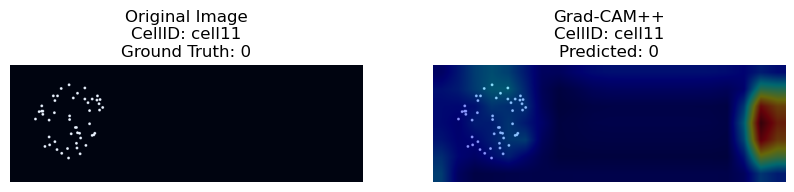

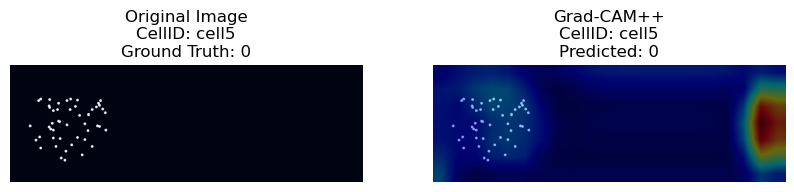

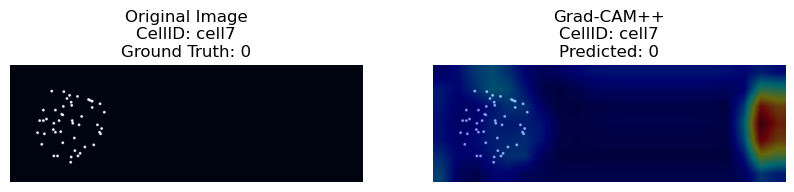

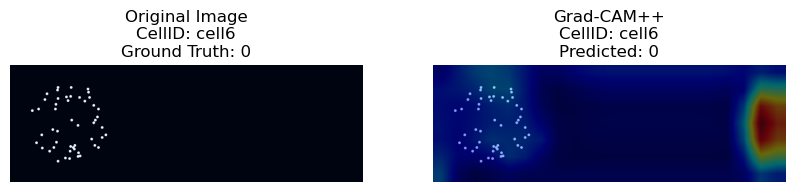

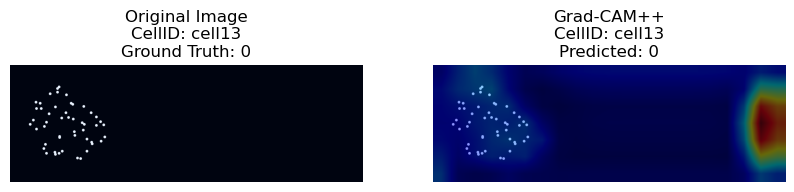

...

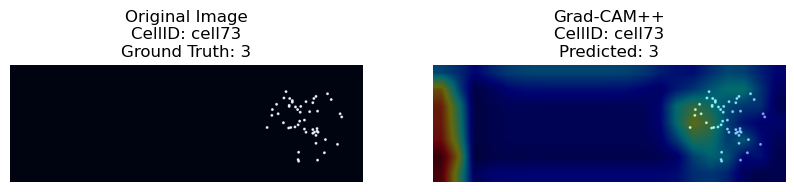

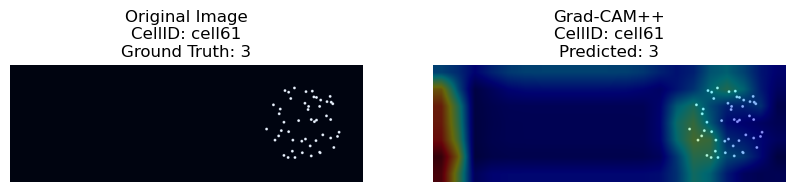

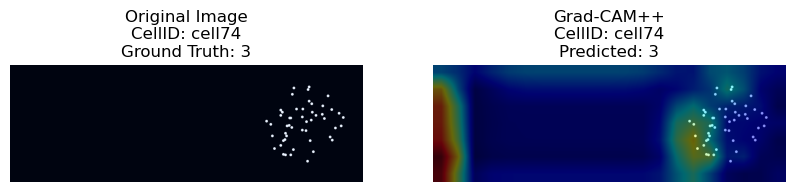

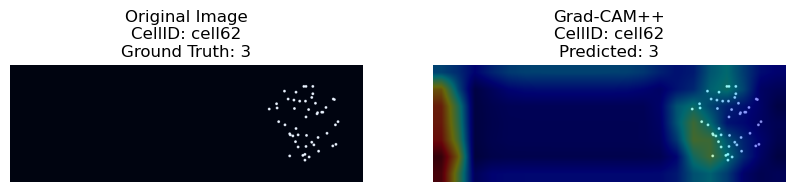

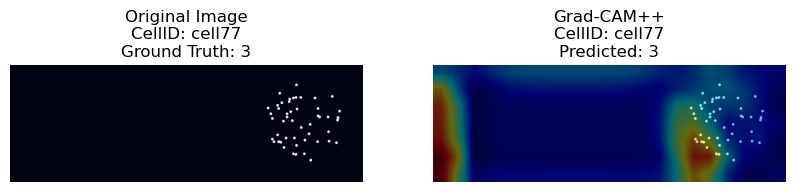

In [133]:
# Select an image from the dataset
for image_idx in range(0, 80):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # For visualization

    # Perform a forward pass and backward pass
    model2.eval()
    output = model2(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model2.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam_pp2.generate_heatmap(class_idx)

    # Normalize and prepare original image for visualization
    original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())
    original_image = (original_image * 255).astype(np.uint8)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)

    # Overlay the heatmap on the original image
    overlay = overlay_heatmap(original_image, heatmap)

    # Get ground truth label (from your dataset)
    ground_truth_label = cluster_labels[image_idx].item()

    # Get the corresponding cell ID
    cell_id = file_list[image_idx].split('/')[-1]

    # Plot the original image and the Grad-CAM result with labels and cellID in the title
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Original Image\nCellID: {cell_id}\nGround Truth: {ground_truth_label}")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Grad-CAM++\nCellID: {cell_id}\nPredicted: {class_idx}")
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.show()

In [ ]:
# Dictionary to store heatmaps for each cluster
cluster_heatmaps = {label: [] for label in unique_labels}

for image_idx in range(len(images_all_tensor)):
    image = images_all_tensor[image_idx].unsqueeze(0)  # Add batch dimension
    original_image = image[0].permute(1, 2, 0).cpu().numpy()  # Extract original image

    # Forward and backward pass
    model2.eval()
    output = model2(image.to('cpu'))  # Forward pass
    class_idx = torch.argmax(output, dim=1).item()  # Predicted class
    model2.zero_grad()
    output[0, class_idx].backward()  # Compute gradients for the predicted class

    # Generate Grad-CAM heatmap
    heatmap = gradcam_pp2.generate_heatmap(class_idx)

    # Store heatmap in corresponding cluster
    cluster_label = cluster_labels[image_idx].item()
    cluster_heatmaps[cluster_label].append(heatmap)

# Compute and visualize the average heatmap for each cluster
for cluster_label, heatmaps in cluster_heatmaps.items():
    if len(heatmaps) > 0:
        avg_heatmap = np.mean(np.stack(heatmaps), axis=0)  # Compute mean heatmap
        
        # Normalize the heatmap
        avg_heatmap = (avg_heatmap - avg_heatmap.min()) / (avg_heatmap.max() - avg_heatmap.min())

        # Resize and apply colormap
        avg_heatmap = cv2.resize(avg_heatmap, (224, 224))
        avg_heatmap = np.uint8(255 * avg_heatmap)
        avg_heatmap = cv2.applyColorMap(avg_heatmap, cv2.COLORMAP_JET)

        # Display the averaged heatmap
        plt.figure(figsize=(6, 6))
        plt.imshow(avg_heatmap)
        plt.title(f"Average Grad-CAM++ for Cluster {cluster_label}")
        plt.axis("off")
        plt.show()

### SHAP

In [142]:
import shap

In [157]:
# Define the modified MLP classifier
from RESNET101 import resnet101, ResNet101_Weights
class MLPResNetClassifier(pl.LightningModule):
    def __init__(self, num_classes=4, dropout_rate=0.1):
        super().__init__()
        # Feature extractor (ResNet50)
        self.feature_extractor = resnet101(weights=ResNet101_Weights.DEFAULT)
        self.feature_extractor.fc = nn.Identity()  # Remove the final classification layer

        # Fully connected layers (MLP)
        hidden_sizes = [2048, 1024, 512, 256] 
        self.feature_layers = nn.Sequential(
            nn.Linear(hidden_sizes[0], hidden_sizes[1]),
            nn.BatchNorm1d(hidden_sizes[1]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[1], hidden_sizes[2]),
            nn.BatchNorm1d(hidden_sizes[2]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_sizes[2], hidden_sizes[3]),
            nn.BatchNorm1d(hidden_sizes[3]),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
        )

        # Output layer
        self.output = nn.Linear(hidden_sizes[3], num_classes)

        # Loss function
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, patches):
        # Extract features using ResNet50
        x = self.feature_extractor(patches)
        x = self.feature_layers(x)  # Pass through MLP
        x = self.output(x)  # Output classification scores
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=0.001)
"""
# Prepare data
images_all_tensor = images_all_tensor.to('cuda')
cluster_labels = cluster_labels.to('cuda')
dataset = TensorDataset(images_all_tensor, cluster_labels)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

# Initialize model
model = MLPResNetClassifier(num_classes=4)
model = model.to('cuda')

# Initialize PyTorch Lightning Trainer
trainer = Trainer(max_epochs=12)

# Train the model
trainer.fit(model, dataloader)


"""
# Evaluation function
def evaluate_model(model, dataloader):
    model.eval()  # Set model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, labels in dataloader:
            images, labels = images.to('cpu'), labels.to('cpu')  # Move data to GPU
            outputs = model(images)  # Get model predictions
            _, predicted = torch.max(outputs, 1)  # Get predicted class
            total += labels.size(0)
            correct += (predicted == labels).sum().item()  # Count correct predictions

    accuracy = 100 * correct / total
    return accuracy


# Create a test DataLoader
#test_dataset = TensorDataset(images_all_tensor, cluster_labels)  # Replace with test tensors
#test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Evaluate the model
#accuracy = evaluate_model(model, test_dataloader)
#print(f"Model Accuracy: {accuracy:.2f}%")

In [158]:
X = images_all_tensor.cpu().numpy()  # If on GPU, move to CPU for splitting
y = cluster_labels.cpu().numpy()

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [ ]:
from RESNET101 import resnet101, ResNet101_Weights
fold = 1
for train_index, val_index in skf.split(X, y):
    print(f"Fold {fold}...")

    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

    # Convert back to tensors
    X_train_tensor = torch.from_numpy(X_train)
    X_val_tensor   = torch.from_numpy(X_val)
    y_train_tensor = torch.from_numpy(y_train).long()
    y_val_tensor   = torch.from_numpy(y_val).long()

    # 1) Create a DataLoader for training
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

    # 2) Create a DataLoader for validation
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

    # 3) Initialize your model (MLPResNetClassifier)
    model = MLPResNetClassifier(num_classes=4)
    model = model.to('cuda')

    # 4) Train your model (PyTorch Lightning, or manual training loop)
    trainer = Trainer(max_epochs=12)
    trainer.fit(model, train_loader)

    # 5) Evaluate on val_loader
    val_accuracy = evaluate_model(model, val_loader)
    print(f"Fold {fold} Accuracy: {val_accuracy:.2f}%")

    # 6) Pick a small background set from the training set for SHAP
    #    Let's say we choose 10 random images from X_train
    background_size = 10
    idx_bg = np.random.choice(len(X_train), background_size, replace=False)
    background_data = X_train_tensor[idx_bg].clone().detach()

    # 7) Compute SHAP on the validation set
    #    Move model and data to CPU for SHAP (often simpler)
    model.cpu().eval()
    background_data = background_data.cpu()
    X_val_tensor_cpu = X_val_tensor_cpu.requires_grad_(True)

    import shap
    explainer = shap.DeepExplainer(model, background_data)
    shap_values = explainer.shap_values(X_val_tensor_cpu)

    # 8) (Optional) Visualize or store SHAP values for this fold
    #    For multi-class (4 classes), shap_values is a list of 4 arrays
    #    Each array has shape (val_size, channels, H, W)

    fold += 1


Fold 1...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type             | Params
-------------------------------------------------------
0 | feature_extractor | ResNet           | 42.5 M
1 | feature_layers    | Sequential       | 2.8 M 
2 | output            | Linear           | 1.0 K 
3 | criterion         | CrossEntropyLoss | 0     
-------------------------------------------------------
45.3 M    Trainable params
0         Non-trainable params
45.3 M    Total params
181.036   Total estimated model params size (MB)
/home/deev/anaconda3/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=12` reached.


Fold 1 Accuracy: 25.00%


RuntimeError: Output 0 of BackwardHookFunctionBackward is a view and is being modified inplace. This view was created inside a custom Function (or because an input was returned as-is) and the autograd logic to handle view+inplace would override the custom backward associated with the custom Function, leading to incorrect gradients. This behavior is forbidden. You can fix this by cloning the output of the custom Function.

: 